<a href="https://colab.research.google.com/github/Bakarime27/cnn-computer-vision/blob/main/cnn_dogs_breed_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


##**Classer des images à l'aide d'algorithme de Deep Learning**

Ce projet a pour objectif de développer un algorithme de détection de la race d'un chien sur une photo

### **1.&nbsp;Description du dataset**


Le dataset dont nous disposons correspond à la Stanford Dogs dataset qui contients des images de 120 races de chien.
Il est constitué de deux répertoires
* **images** : qui contient des sous répertoires correspondant chacun à une race de chien. Chacun de ces sous répertoires contient les images de chiens
* **annotation** : qui contient aussi des sous répertoires correspondant chacun à une race de chien, chaque sous répertoire contenant les annoation

### **2.&nbsp;Chargement des données**


In [ ]:
from google.colab import drive
#drive.mount("/gdrive", force_remount=True)
#drive.flush_and_unmount()
drive.mount('/gdrive')
%cd /gdrive/MyDrive/Datasets
%ls

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).
/gdrive/MyDrive/Datasets
2016_Building_Energy_Benchmarking.csv  olist-customers-segmentation.csv
annotation/                            olist_geolocation_dataset.csv
clean-data.csv                         olist_order_items_dataset.csv
CNN_model_nprep_plot.png               olist_order_payments_dataset.csv
CNN_model_plot.png                     olist_order_reviews_dataset.csv
CNN_model_prep_plot_new_archi.png      olist_orders_dataset.csv
CNN_model_prep_plot.png                olist_products_dataset.csv
corinfomax-ssl-from-serdarozsoy/       olist-rfm.csv
Dataset/                               olist_sellers_dataset.csv
data_tweets2_3000.csv                  product_category_name_translation.csv
distributed-bck/                       resnet50_model.h5
flagged/                               sea-clean-data.csv
fr.openfoodfacts.org.products.csv      stackoverflow-clean-data.csv

**Install of modules and library**

In [ ]:
! pip install gradio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.7/19.7 MB 57.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 75.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.0/57.0 kB 8.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 288.4/288.4 kB 37.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.4/75.4 kB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 31.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.5/50.5 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.0/137.0 kB 21.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 

In [ ]:
! pip install tensorflow==2.9.3

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
! pip install keras-tuner --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.1/176.1 kB 17.4 MB/s eta 0:00:00


In [ ]:
# Import libraries
import os
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from time import time
import timeit
import cv2 as cv
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

import tensorflow as tf
from tensorflow import keras
import keras.utils as image
#from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.utils.vis_utils import plot_model
from keras import backend as K
import keras_tuner as kt
from keras.models import load_model

from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense

import gradio as gr

In [ ]:
print(tf.__version__)
print("Number of GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print(tf.test.is_built_with_cuda())

2.9.3
Number of GPUs Available:  1
True


In [ ]:
device_name = tf.test.gpu_device_name()
if "GPU" not in device_name:
    print("GPU device not found")
else:
  print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


### **3.&nbsp;Preprocessing**


Nous commençons d'abord par analyser les deux répertoires de données

In [ ]:
# Define path to data
annotations_dir = './annotation/Annotation/'
images_dir = './images/Images/'

In [ ]:
# Count the number of classes (dogs breeds)
breed_list = os.listdir(images_dir)
print("Number of breeds in dataset:", (len(breed_list)))

Number of breeds in dataset: 120


Nous avons bien 120 races de chien dans notre dataset, cela correspond à 120 classes pour notre classificateur.

### **3.1.&nbsp;Analyse graphique**


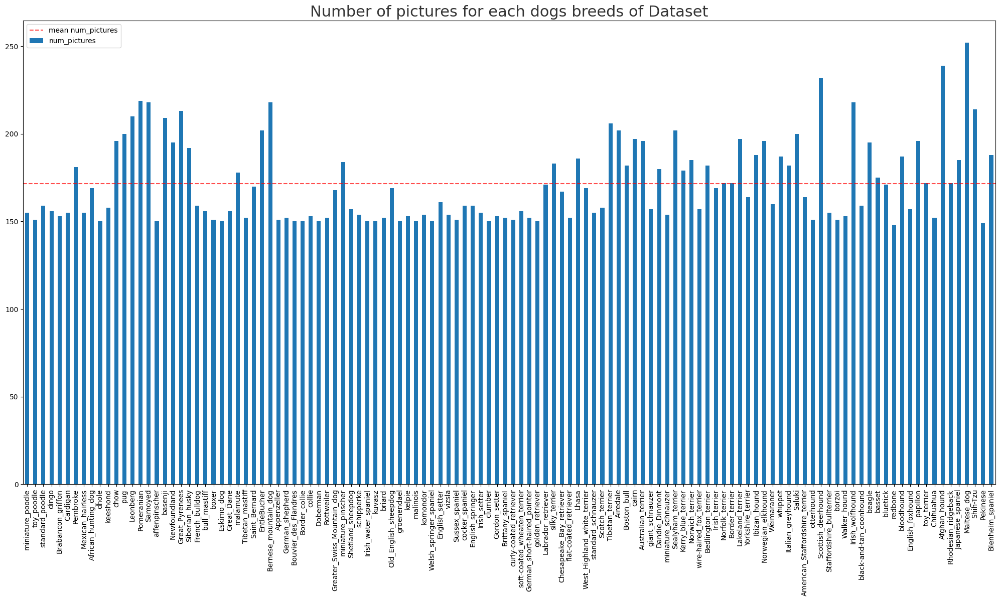

In [ ]:
# Count number of pictures for each breed
df_breeds = pd.DataFrame(
    index=[breed.split('-',1)[1]
           for breed in breed_list],
    data=[len(os.listdir(images_dir + "/" + name))
          for name in breed_list],
    columns=["num_pictures"])

# Plot results
fig, ax = plt.subplots(1, 1, figsize=(25,12))
df_breeds.plot(kind="bar",
               legend=False,
               ax=ax)
ax.axhline(df_breeds["num_pictures"].mean(),
           color='r', alpha=.7,
           linestyle='--',
           label="mean num_pictures")
plt.title("Number of pictures for each "\
          "dogs breeds of Dataset",
          color="#343434", fontsize=22)
plt.legend()
plt.savefig("../images/deep-learning/nb-pic-of-dogs-breeds.png")
plt.show()

La moyenne se situant autour de 170, on constate qu'aucune race n'est sous représentée

Nous allons maintenant observer quelques photos par race

In [ ]:
def show_images_classes(path, classes, num_sample):
    """This function is used to display the first
    n images of a directory passed as an argument.
    It is adapted to subdirectories.

    The matplotlib.image library must be loaded
    with the alias mpimg.

    Parameters
    ----------------------------------------
    path : string
        Link of root directory
    classes : string
        Name of the subdirectory
    num_smaple : integer
        Number of picture to show
----------------------------------------
    """
    fig = plt.figure(figsize=(20,20))
    fig.patch.set_facecolor('#343434')
    plt.suptitle("{}".format(classes.split("-")[1]), y=.83,
                 color="white", fontsize=22)
    images = os.listdir(path + "/" + classes)[:num_sample]
    for i in range(num_sample):
        img = mpimg.imread(path+"/"+classes+"/"+images[i])
        plt.subplot(int(num_sample/5+1), 5, i+1)
        plt.imshow(img)
        plt.axis('off')
    plt.show()

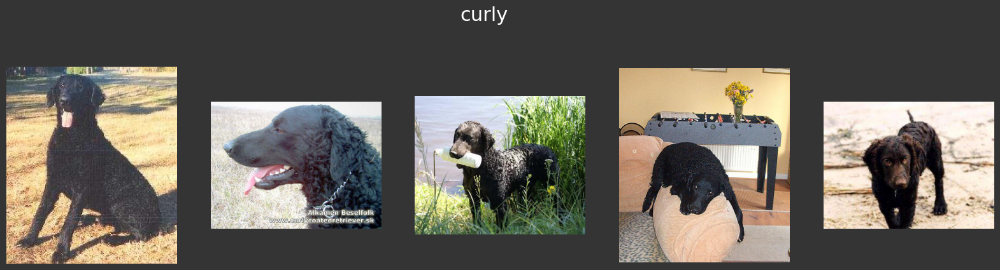

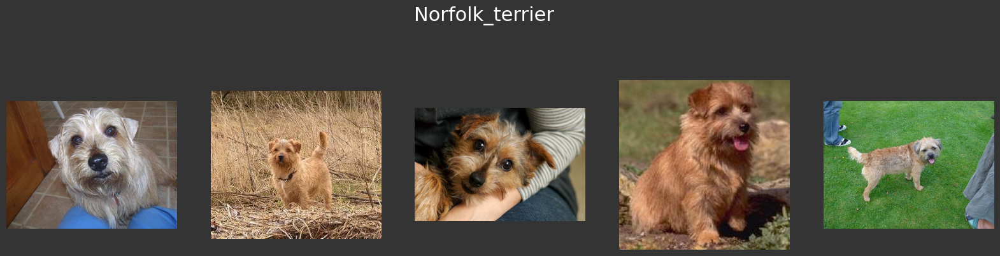

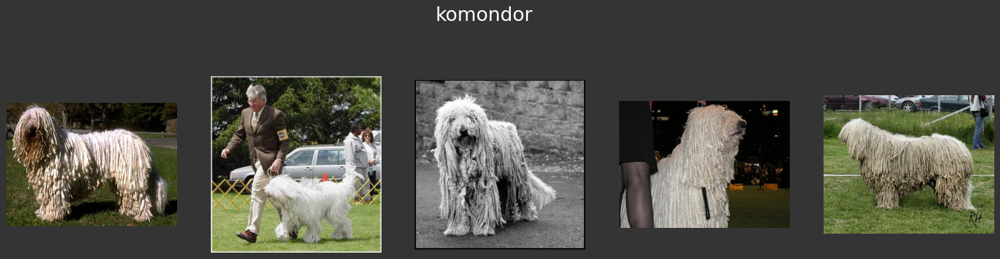

In [ ]:
for i in np.random.randint(0, len(breed_list), size=3):
    show_images_classes(images_dir, breed_list[i], 5)

### **3.2.&nbsp;Modification de la taille des images**


On peut remarquer dans les images en exemple ci-dessus que les chiens présents sur les photos ne sont pas toujours au centre de la photo, que les zooms sont différents. Redimensionner les images ne va pas changer ces attributs, l'image va même être déformée pour coller au nouvelles dimensions.

Nous allons réaliser la transformation sur une image test pour commencer.

In [ ]:
# Define test image
img_test = (images_dir
            + "n02096294-Australian_terrier/n02096294_6213.jpg")
img_test = cv.imread(img_test)

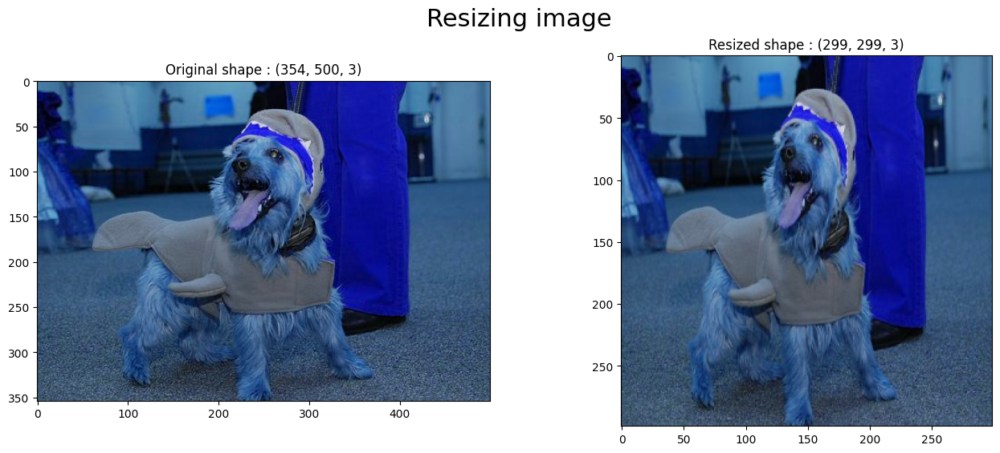

In [ ]:
# setting dim of the resize
height = 299
width = 299
dim = (width, height)
# resize image with OpenCV
res_img = cv.resize(img_test, dim, interpolation=cv.INTER_LINEAR)

# Show both img
fig = plt.figure(figsize=(16,6))
plt.subplot(1, 2, 1)
plt.imshow(img_test)
plt.title("Original shape : {}".format(img_test.shape))
plt.subplot(1, 2, 2)
plt.imshow(res_img)
plt.title("Resized shape : {}".format(res_img.shape))
plt.suptitle("Resizing image",
             color="black",
             fontsize=22, y=.98)
plt.savefig("../images/deep-learning/resizing.png")
plt.show()

On constate une déformation de l'image initiale après la redimensionnement

### **3.3.&nbsp;Modification de l'histogramme des images**



L'histogramme d'une image numérique est une courbe statistique représentant la répartition de ses pixels selon leur intensité. Commençons par regarder une image en particulier

Nous allons transformer l'image dans différents codages couleurs. Le système de codage YUV est créé depuis une source RVB. Il est codé en trois composantes : Y représente la luminance (informations de luminosité) tandis que les deux autres (U et V) sont des données de chrominance (informations de couleur). Ce format nous permet de visualiser au mieux l'histogramme pour les 3 dimensions

In [ ]:
# Transform image with differents color sets
img_RGB = cv.cvtColor(img_test, cv.COLOR_BGR2RGB)
img_grayscale = cv.cvtColor(img_test, cv.COLOR_RGB2GRAY)
img_YUV = cv.cvtColor(img_test,cv.COLOR_BGR2YUV)

In [ ]:
# Create histogram
def plot_histogram(init_img, convert_img,outpath):
    """Function allowing to display the initial
    and converted images according to a certain
    colorimetric format as well as the histogram
    of the latter.

    Parameters
    -------------------------------------------
    init_img : list
        init_img[0] = Title of the init image
        init_img[1] = Init openCV image
    convert_img : list
        convert_img[0] = Title of the converted
        convert_img[1] = converted openCV image
    -------------------------------------------
    """
    hist, bins = np.histogram(
                    convert_img[1].flatten(),
                    256, [0,256])
    # Cumulative Distribution Function
    cdf = hist.cumsum()
    cdf_normalized = cdf * float(hist.max()) / cdf.max()

    # Plot histogram
    fig = plt.figure(figsize=(25,6))
    plt.subplot(1, 3, 1)
    plt.imshow(init_img[1])
    plt.title("{} Image".format(init_img[0]),
              color="#343434")
    plt.subplot(1, 3, 2)
    plt.imshow(convert_img[1])
    plt.title("{} Image".format(convert_img[0]),
              color="#343434")
    plt.subplot(1, 3, 3)
    plt.plot(cdf_normalized,
             color='r', alpha=.7,
             linestyle='--')
    plt.hist(convert_img[1].flatten(),256,[0,256])
    plt.xlim([0,256])
    plt.legend(('cdf','histogram'), loc = 'upper left')
    plt.title("Histogram of convert image", color="#343434")
    plt.suptitle("Histogram and cumulative "\
                 "distribution for test image",
              color="black", fontsize=22, y=.98)
    plt.savefig(outpath)
    plt.show()


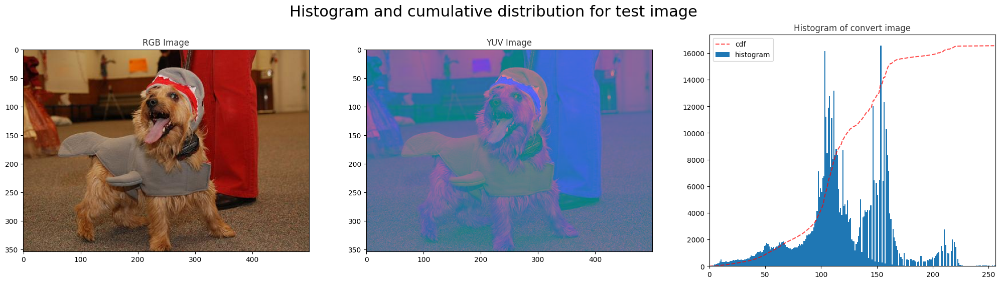

In [ ]:
plot_histogram(["RGB", img_RGB], ["YUV", img_YUV],"../images/deep-learning/hist-dist.png")


### **3.4.&nbsp;Egalisation**


On constate ici des pics importants au centre de l'histogramme. Pour effectuer une bonne égalisation (amélioration du contraste), il est nécessaire de répartir la lumière dans tout le spectre de l'image.

Nous allons tester l'égalisation dans l'espace YUV, car cela permet de pouvoir agir sur lae canal de la luminosité (Y) indépendamment des autres canaux de couleurs(U,V)

In [ ]:
# Equalization
img_YUV[:,:,0] = cv.equalizeHist(img_YUV[:,:,0])
img_equ = cv.cvtColor(img_YUV, cv.COLOR_YUV2RGB)


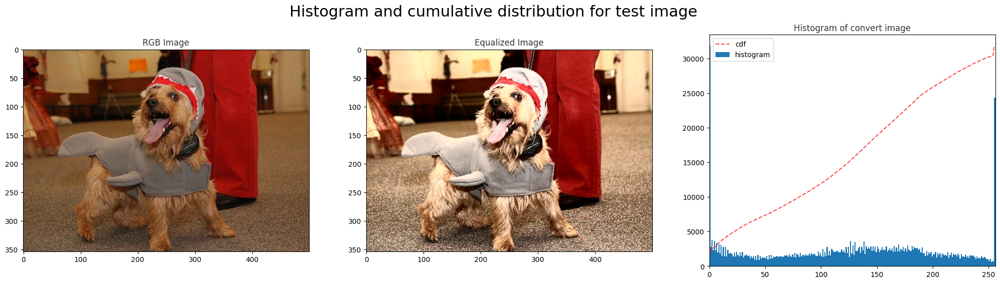

In [ ]:
plot_histogram(["RGB", img_RGB], ["Equalized", img_equ],"../images/deep-learning/hist-dist-equ.png")

L'image résultante est donc bien égualisée, l'histogramme couvre l'ensemble du spectre et la CDF est constante et linéaire

### **3.5.&nbsp;Application de filtres**


Les images peuvent pour de nombreuses raisons être bruitées, c'est à dire comporter des pixels atypiques qui peuvent fausser la détection de features.

Pour pallier au bruit présent dans les images, il est possible d'appliquer un filtre. Il en existe de plusieurs types : les filtres linéaires (comme le filtre Gaussien), non linéaires comme le filtre médian. Cependant l'un des meilleurs filtre pour débruiter l'image est le filtre des moyennes non locales.

Contrairement aux filtres « moyenne locale », qui prennent la valeur moyenne d'un groupe de pixels entourant un pixel cible pour lisser l'image, le filtre des moyennes non locales prend une moyenne de tous les pixels de l'image, pondérée par la similarité de ces pixels avec le pixel cible. Cela se traduit par une clarté de post-filtrage beaucoup plus grande et moins de perte de détails dans l'image par rapport aux algorithmes de moyenne locale

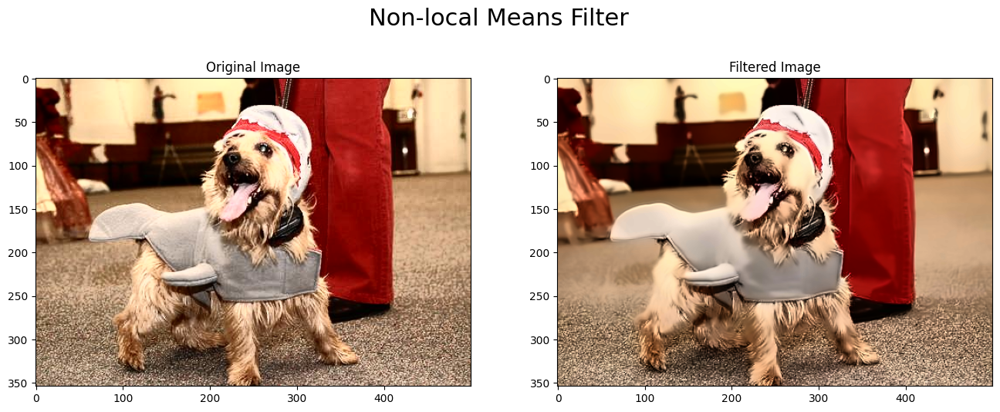

In [ ]:
# Apply non-local means filter on test img
dst_img = cv.fastNlMeansDenoisingColored(
    src=img_equ,
    dst=None,
    h=10,
    hColor=10,
    templateWindowSize=7,
    searchWindowSize=21)

# Show both img
fig = plt.figure(figsize=(16,6))
plt.subplot(1, 2, 1)
plt.imshow(img_equ)
plt.title("Original Image")
plt.subplot(1, 2, 2)
plt.imshow(dst_img)
plt.title("Filtered Image")
plt.suptitle("Non-local Means Filter",
             color="black",
             fontsize=22, y=.98)
plt.savefig("../images/deep-learning/filter.png")
plt.show()

### **3.6.&nbsp;Augmentation des données**


Le risque sur ce type de dataset comportant peu de données (20 000 images) est de sur-entrainer notre modèle, il ne pourra pas développer des règles de décisions pouvant être généralisé à de nouvelles données. Il faut donc augmenter le nombre de data et pour cela, nous allons utiliser la Data Augmentation.

L'objectif de la data augmentation est de reproduire les images préexistantes en leur appliquant une transformation aléatoire. Pour cela, Keras mets à disposition la méthode ImageDataGenerator qui permet de faire à la fois du mirroring, de la rotation, des zoom ... et ce de manière aléatoire !

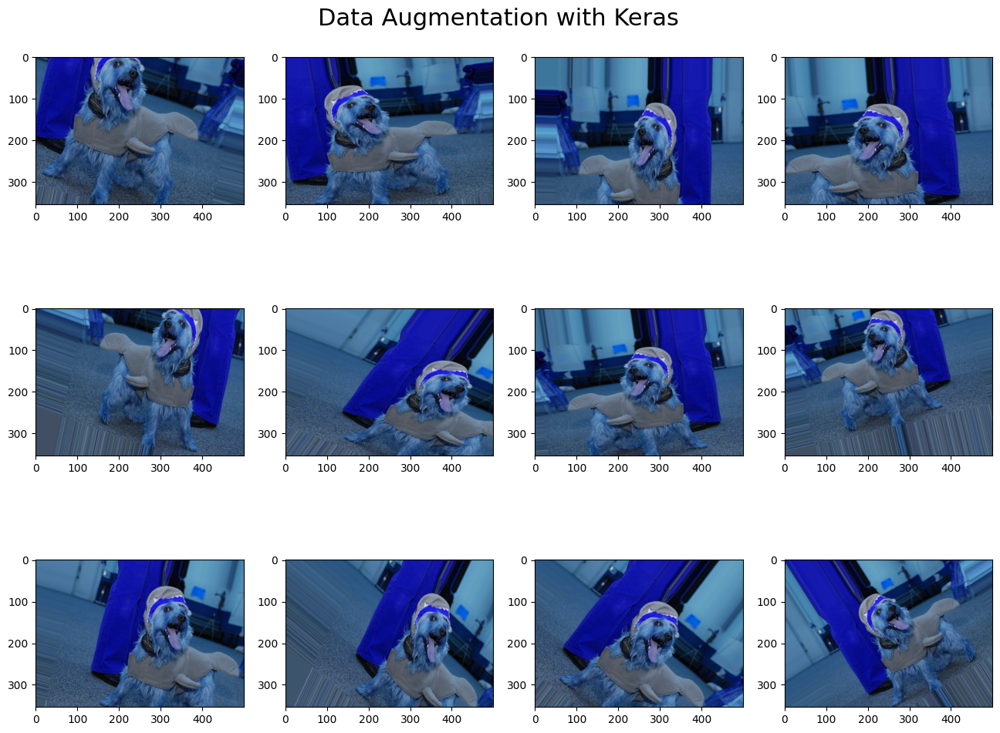

In [ ]:
#Initilize Data Generator Keras
augmented_datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

# Convert test img to array
x = image.img_to_array(img_test)
x = x.reshape((1,) + x.shape)

i=0
fig = plt.figure(figsize=(16,12))
for batch in augmented_datagen.flow(x, batch_size=1):
    ax = fig.add_subplot(3,4,i+1)
    ax.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 12 == 0:
        break

plt.suptitle("Data Augmentation with Keras",
             color="black",
             fontsize=22, y=.90)
plt.savefig("../images/deep-learning/data-augmentation.png")
plt.show()

### **3.7.&nbsp;Fonction de preprocessing**

Pour réduire le temps de calcul, nous allons réduire le nombre de races à 10

In [ ]:
limited_breed_list = [
    'n02096294-Australian_terrier',
    'n02093256-Staffordshire_bullterrier',
    'n02099601-golden_retriever',
    'n02106662-German_shepherd',
    'n02086240-Shih-Tzu',
    'n02099712-Labrador_retriever',
    'n02088364-beagle',
    'n02100735-English_setter',
    'n02102318-cocker_spaniel',
    'n02108915-French_bulldog']

Nous allons maintenant créer une fonction qui applique les méthodes de preprocessing (vues plus haut) par lot d'images.

In [ ]:
def data_with_prep(directories, img_width, img_height):
    """Preprocessing of images in order to integrate them
    into a convolutional neural network. Equalization,
    Denoising and transformation of the image into Array.
    Simultaneous creation of labels (y).

    Parameters
    ---------------------------------------------------
    directories : list
        List of files to be processed.
    img_width : integer
        width of the image to be reached for resizing
    img_height : integer
        height of the image to be reached for resizing
    ---------------------------------------------------
    """
    img_list=[]
    labels=[]
    for index, breed in enumerate(directories):
        for image_name in os.listdir(images_dir+"/"+breed):
            # Read image
            img = cv.imread(images_dir+"/"+breed+"/"+image_name)
            img = cv.cvtColor(img,cv.COLOR_BGR2RGB)
            # Resize image
            dim = (img_width, img_height)
            img = cv.resize(img, dim, interpolation=cv.INTER_LINEAR)
            # Equalization
            img_yuv = cv.cvtColor(img,cv.COLOR_BGR2YUV)
            img_yuv[:,:,0] = cv.equalizeHist(img_yuv[:,:,0])
            img_equ = cv.cvtColor(img_yuv, cv.COLOR_YUV2RGB)
            # Apply non-local means filter on test img
            dst_img = cv.fastNlMeansDenoisingColored(
                src=img_equ,
                 dst=None,
                h=10,
                hColor=10,
                templateWindowSize=7,
                searchWindowSize=21)

            # Convert modified img to array
            img_array = image.img_to_array(dst_img)

            # Append lists of labels and images
            img_list.append(np.array(img_array))
            labels.append(breed.split("-")[1])

    return img_list, labels

Nous créons également cette fonction de récupération des images sans preprocessing pour construire un réseau de neuronne baseline et le comparer à ceux créer avec les images traitées

In [ ]:
def data_without_prep(directories):
    """Getting images in order to integrate them
    into a convolutional neural network.
    Transformation of the image into Array.
    Simultaneous creation of labels (y).

    Parameters
    ---------------------------------------------------
    directories : list
        List of files to be got.
    ---------------------------------------------------
    """
    img_list=[]
    labels=[]
    for index, breed in enumerate(directories):
        for image_name in os.listdir(images_dir+"/"+breed):
            # Read image
            img = cv.imread(images_dir+"/"+breed+"/"+image_name)
            img = cv.cvtColor(img,cv.COLOR_BGR2RGB)

            # Resize image
            img_width = 299
            img_height = 299
            dim = (img_width, img_height)
            img = cv.resize(img, dim, interpolation=cv.INTER_LINEAR)

            # Convert modified img to array
            img_array = image.img_to_array(img)

            # Append lists of labels and images
            img_list.append(np.array(img_array))
            labels.append(breed.split("-")[1])

    return img_list, labels

Nous créons une nouvelle fonction qui nous permet de séparer les variables de la target.

In [ ]:
def get_data(breed_list,prep):
    # Define numbers of breeds to preprocess
    num_breeds = len(breed_list)

    if prep == True:
      X, y = data_with_prep(breed_list, 299, 299)
    else:
      X, y = data_without_prep(breed_list)
    # Convert in numpy array
    X = np.array(X)
    y = np.array(y)

    return X, y

Cette partie est réalisée dans le but de tester le résultat des deux fonctions "data_with_prep" et "data_without_prep"

In [ ]:
def get_data_(breed_list,prep):
    # Define numbers of breeds to preprocess
    num_breeds = len(breed_list)

    # Execute preprocessor on selection
    start_time = timeit.default_timer()
    if prep == True:
      X, y = data_with_prep(breed_list, 299, 299)
    else:
      X, y = data_without_prep(breed_list)
    # Convert in numpy array
    X = np.array(X)
    y = np.array(y)
    process_time = timeit.default_timer() - start_time
    print("-" * 50)
    print("Processing :")
    print("-" * 50)
    print("Number of images processed : {}"\
        .format(len(y)))
    print("Shape of images np.array : {}"\
        .format(X.shape))
    print("Total time : {:.2f}s".format(process_time))

In [ ]:
get_data_(limited_breed_list,True)

--------------------------------------------------
Processing :
--------------------------------------------------
Number of images processed : 1712
Shape of images np.array : (1712, 299, 299, 3)
Total time : 593.69s


In [ ]:
get_data_(limited_breed_list,False)

--------------------------------------------------
Processing :
--------------------------------------------------
Number of images processed : 1712
Shape of images np.array : (1712, 299, 299, 3)
Total time : 26.73s


In [ ]:
X_nprep,y_nprep = get_data(limited_breed_list,False)

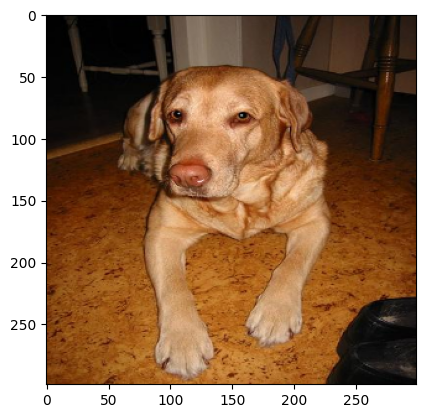

In [ ]:
plt.imshow(image.array_to_img(X_nprep[1000]))

In [ ]:
X_prep,y_prep = get_data(limited_breed_list,True)

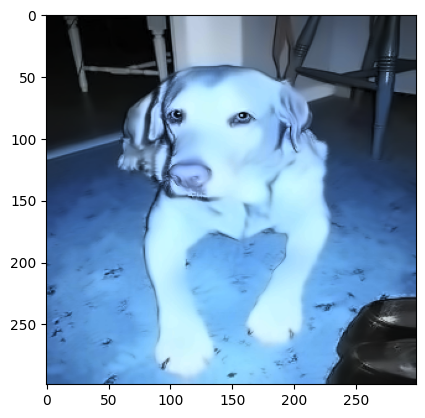

In [ ]:
plt.imshow(image.array_to_img(X_prep[1000]))

### **4.&nbsp;Modèle CNN**

Dans cette section nous allons construire un modèle un modèle CNN avec les données brutes et aussi avec les données pré-traîtées histoire de comparer et voir l'impact du preprocessing sur la performance du modèle.

Pour entrainer notre premier modèle, nous devons dans un premier temps mélanger les images car actuellement, toutes les photos d'une même race se suivent. Ce brassage a pour objectif de réduire la variance et de s'assurer que les modèles ne soient pas sur-entraînés.

### **4.1.&nbsp;Modèle avec les données brutes**

### **4.1.1.&nbsp;Préparation des données brutes**

In [ ]:
# Using np.shuffle
img_space_nprep = np.arange(X_nprep.shape[0])
np.random.seed(8)
# Shuffle the space
np.random.shuffle(img_space_nprep)
# Apply to X_nprep and y_nprep in same order
X_nprep_shuffle = X_nprep[img_space_nprep]
y_nprep_shuffle = y_nprep[img_space_nprep]

Pour les modélisations Keras, il faut convertir nos données à prédire (y) en variable numérique. En effet, pour le moment, ce sont des données textuelles qui sont stockées dans y. Nous allons donc utiliser un simple LabelEncoder pour les convertir.

In [ ]:
# Change X type
X_nprep_shuffle = X_nprep_shuffle.astype(np.float32)
#X_nprep_shuffle = np.asarray(X_nprep_shuffle, dtype = np.float64, order = 'C')

In [ ]:
# Encode y text data in numeric
encoder = LabelEncoder()
encoder.fit(y_nprep_shuffle)
y_nprep_shuffle = encoder.transform(y_nprep_shuffle)

In [ ]:
print(encoder.classes_)

['Australian_terrier' 'English_setter' 'French_bulldog' 'German_shepherd'
 'Labrador_retriever' 'Shih' 'Staffordshire_bullterrier' 'beagle'
 'cocker_spaniel' 'golden_retriever']


A présent, nous pouvons créer les sets d'entrainement et de test qui serviront à l'entrainement de nos modèles. Le set de validation quant à lui sera créé directement dans le générateur Keras.

In [ ]:
### Create train and test set
x_nprep_train, x_nprep_test, y_nprep_train, y_nprep_test = train_test_split(X_nprep_shuffle, y_nprep_shuffle, test_size = 0.2, random_state = 42)

print("-" * 50)
print("Size of created sets :")
print("-" * 50)
print("Train set size = ",x_nprep_train.shape[0])
print("Test set size = ",x_nprep_test.shape[0])

--------------------------------------------------
Size of created sets :
--------------------------------------------------
Train set size =  1369
Test set size =  343


Dernière étape de la préparation, nous allons créer les générateurs Keras pour les sets de données en incluant la Data Augmentation pour le jeu d'entrainement :

In [ ]:
# Data generator on train set with Data Augmentation
# Validation set is define here
train_datagen_nprep = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2)
#For validation and test, just rescale
test_datagen_nprep = ImageDataGenerator(rescale=1./255,)

### **4.1.2.&nbsp;Construction du modèle CNN sur données brutes**

Nous allons ici initialiser un premier modèle de réseau de neurones à convolution en imbriquant plusieurs couches :

* Couches de convolution : Son but est de repérer la présence d'un ensemble de features dans les images reçues en entrée. Pour cela, on réalise un filtrage par convolution.
* Couches de Pooling : L'opération de pooling consiste à réduire la taille des images, tout en préservant leurs caractéristiques importantes.
* Couches de correction ReLU : La couche de correction ReLU remplace toutes les valeurs négatives reçues en entrées par des zéros. Elle joue le rôle de fonction d'activation.
* Couches Fully connected : Ce type de couche reçoit un vecteur en entrée et produit un nouveau vecteur en sortie. Pour cela, elle applique une combinaison linéaire puis éventuellement une fonction d'activation aux valeurs reçues en entrée.
* DropOut : La méthode du dropout consiste à « désactiver » des sorties de neurones aléatoirement pour éviter le sur-entraînement.

Pour notre modèle, nous allons tester une architecture simple, pas trop profonde qui nous servira de baseline pour les procheins modèles. Nous allons donc implémenter uniquement 3 couches de convolution.

Nous allons également définir des métriques plus précises que Accuracy pour l'évaluation de notre modèle, comme par exemple le Score F1 qui combine precision et recall :

In [ ]:
def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

In [ ]:
# Define numbers of breeds to preprocess
num_breeds = len(limited_breed_list)

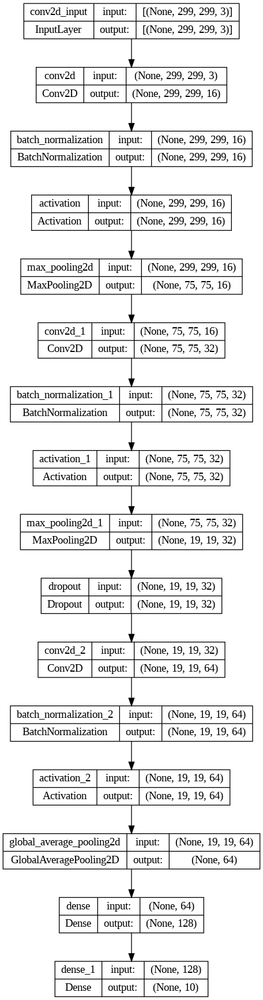

In [ ]:
K.clear_session()
model_nprep = Sequential()
# Convolution layer
model_nprep.add(Conv2D(filters=16,
                 kernel_size=(3,3),
                 padding='same',
                 use_bias=False,
                 input_shape=(299,299,3)))
model_nprep.add(BatchNormalization(axis=3, scale=False))
model_nprep.add(Activation('relu'))
# Pooling layer
model_nprep.add(MaxPooling2D(pool_size=(4, 4),
                       strides=(4, 4),
                       padding='same'))
# Second convolution layer
model_nprep.add(Conv2D(filters=32,
                 kernel_size=(3,3),
                 padding='same',
                 use_bias=False))
model_nprep.add(BatchNormalization(axis=3, scale=False))
model_nprep.add(Activation('relu'))
model_nprep.add(MaxPooling2D(pool_size=(4, 4), strides=(4, 4), padding='same'))
model_nprep.add(Dropout(0.2))
# Third convolution layer
model_nprep.add(Conv2D(filters=64,
                 kernel_size=(3,3),
                 padding='same',
                 use_bias=False))
model_nprep.add(BatchNormalization(axis=3, scale=False))
model_nprep.add(Activation('relu'))
model_nprep.add(GlobalAveragePooling2D())
# Fully connected layers
model_nprep.add(Dense(128, activation='relu'))
model_nprep.add(Dense(num_breeds, activation='softmax'))
plot_model(model_nprep, to_file='CNN_model_nprep_plot.png',
           show_shapes=True, show_layer_names=True)

In [ ]:
# Compile the CNN Model
model_nprep.compile(optimizer="adam",
              loss="sparse_categorical_crossentropy",
              metrics=["accuracy", f1_m])

Notre modèle est créé, nous allons pouvoir l'entrainer grâce aux générateurs précédement créés et stocker les résultats pour ensuite les analyser :

### **4.1.3.&nbsp;Entraînement du modèle CNN sur données brutes**

In [ ]:
history_nprep = model_nprep.fit(
    train_datagen_nprep.flow(
        x_nprep_train, y_nprep_train,
        batch_size=16,
        subset='training'),
    validation_data=train_datagen_nprep.flow(
        x_nprep_train, y_nprep_train,
        batch_size=16,
        subset='validation'),
    steps_per_epoch=len(x_nprep_train) / 32,
    epochs=20,
    verbose=2)

Epoch 1/20
42/42 - 26s - loss: 2.2958 - accuracy: 0.1221 - f1_m: 9.5536 - val_loss: 2.2952 - val_accuracy: 0.1355 - val_f1_m: 10.2817 - 26s/epoch - 617ms/step
Epoch 2/20
42/42 - 17s - loss: 2.2374 - accuracy: 0.1642 - f1_m: 8.6781 - val_loss: 2.3036 - val_accuracy: 0.1319 - val_f1_m: 9.7656 - 17s/epoch - 388ms/step
Epoch 3/20
42/42 - 17s - loss: 2.2034 - accuracy: 0.1701 - f1_m: 8.9894 - val_loss: 2.3373 - val_accuracy: 0.1538 - val_f1_m: 7.6483 - 17s/epoch - 390ms/step
Epoch 4/20
42/42 - 17s - loss: 2.2009 - accuracy: 0.1759 - f1_m: 8.8053 - val_loss: 2.3277 - val_accuracy: 0.1429 - val_f1_m: 8.5003 - 17s/epoch - 390ms/step
Epoch 5/20
42/42 - 17s - loss: 2.2038 - accuracy: 0.1824 - f1_m: 8.4914 - val_loss: 2.2755 - val_accuracy: 0.1722 - val_f1_m: 9.0253 - 17s/epoch - 388ms/step
Epoch 6/20
42/42 - 17s - loss: 2.1628 - accuracy: 0.2020 - f1_m: 8.4166 - val_loss: 2.3234 - val_accuracy: 0.1575 - val_f1_m: 7.9226 - 17s/epoch - 392ms/step
Epoch 7/20
42/42 - 16s - loss: 2.1527 - accuracy: 0

In [ ]:
def plot_history_scores(dict_history, first_score, second_score, outpath):
    with plt.style.context('seaborn-whitegrid'):
        fig = plt.figure(figsize=(25,10))
        # summarize history for accuracy
        plt.subplot(1, 2, 1)
        plt.plot(dict_history.history[first_score], color="g")
        plt.plot(dict_history.history['val_' + first_score],
                 linestyle='--', color="orange")
        plt.title('CNN model ' + first_score, fontsize=18)
        plt.ylabel(first_score)
        plt.xlabel('epoch')
        plt.legend(['train', 'validation'], loc='upper left')
        # summarize history for loss
        plt.subplot(1, 2, 2)
        plt.plot(dict_history.history[second_score], color="g")
        plt.plot(dict_history.history['val_' + second_score],
                 linestyle='--', color="orange")
        plt.title('CNN model ' + second_score, fontsize=18)
        plt.ylabel(second_score)
        plt.xlabel('epoch')
        plt.legend(['train', 'validation'], loc='upper left')
        plt.savefig(outpath)
        plt.show()

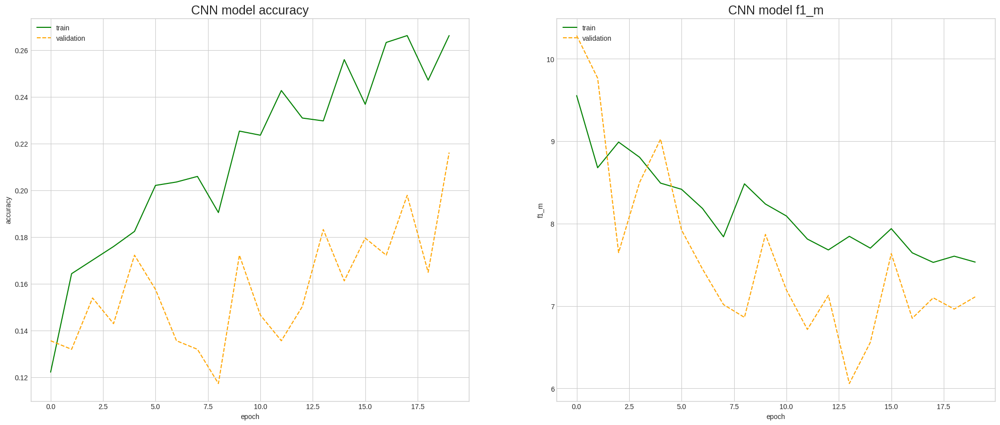

In [ ]:
plot_history_scores(
    dict_history = history_nprep,
    first_score = "accuracy",
    second_score = "f1_m",
    outpath = "../images/deep-learning/accuracy-nprep.png")

### **4.2.&nbsp;Modèle avec les données traîtées**

### **4.2.1.&nbsp;Préparation des données traîtées**

In [ ]:
# Using np.shuffle
img_space_prep = np.arange(X_prep.shape[0])
np.random.seed(8)
# Shuffle the space
np.random.shuffle(img_space_prep)
# Apply to X_prep and y_prep in same order
X_prep_shuffle = X_prep[img_space_prep]
y_prep_shuffle = y_prep[img_space_prep]

In [ ]:
# Change X type
X_prep_shuffle = X_prep_shuffle.astype(np.float32)

In [ ]:
# Encode y_nprep text data in numeric
encoder = LabelEncoder()
encoder.fit(y_prep_shuffle)
y_prep_shuffle = encoder.transform(y_prep_shuffle)

In [ ]:
### Create train and test set
x_prep_train, x_prep_test, y_prep_train, y_prep_test = train_test_split(X_prep_shuffle, y_prep_shuffle, test_size = 0.2, random_state = 42)

print("-" * 50)
print("Size of created sets :")
print("-" * 50)
print("Train set size = ",x_prep_train.shape[0])
print("Test set size = ",x_prep_test.shape[0])

--------------------------------------------------
Size of created sets :
--------------------------------------------------
Train set size =  1369
Test set size =  343


In [ ]:
# Data generator on train set with Data Augmentation
# Validation set is define here
train_datagen_prep = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2)
#For validation and test, just rescale
test_datagen_prep = ImageDataGenerator(rescale=1./255)

### **4.2.2.&nbsp;Construction du modèle CNN sur données taîtées**

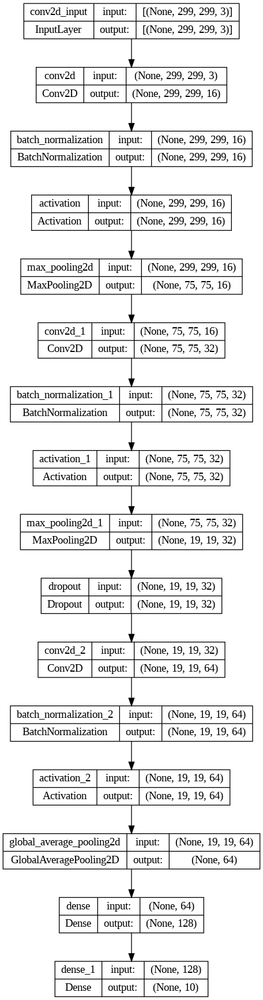

In [ ]:
K.clear_session()
model_prep = Sequential()
# Convolution layer
model_prep.add(Conv2D(filters=16,
                 kernel_size=(3,3),
                 padding='same',
                 use_bias=False,
                 input_shape=(299,299,3)))
model_prep.add(BatchNormalization(axis=3, scale=False))
model_prep.add(Activation('relu'))
# Pooling layer
model_prep.add(MaxPooling2D(pool_size=(4, 4),
                       strides=(4, 4),
                       padding='same'))
# Second convolution layer
model_prep.add(Conv2D(filters=32,
                 kernel_size=(3,3),
                 padding='same',
                 use_bias=False))
model_prep.add(BatchNormalization(axis=3, scale=False))
model_prep.add(Activation('relu'))
model_prep.add(MaxPooling2D(pool_size=(4, 4), strides=(4, 4), padding='same'))
model_prep.add(Dropout(0.2))
# Third convolution layer
model_prep.add(Conv2D(filters=64,
                 kernel_size=(3,3),
                 padding='same',
                 use_bias=False))
model_prep.add(BatchNormalization(axis=3, scale=False))
model_prep.add(Activation('relu'))
model_prep.add(GlobalAveragePooling2D())
# Fully connected layers
model_prep.add(Dense(128, activation='relu'))
model_prep.add(Dense(num_breeds, activation='softmax'))
plot_model(model_prep, to_file='CNN_model_prep_plot.png',
           show_shapes=True, show_layer_names=True)

In [ ]:
# Compile the CNN Model
model_prep.compile(optimizer="adam",
              loss="sparse_categorical_crossentropy",
              metrics=["accuracy", f1_m])

### **4.2.3.&nbsp;Entraînement du modèle CNN sur données traîtées**

In [ ]:
history_prep = model_prep.fit(
    train_datagen_prep.flow(
        x_prep_train, y_prep_train,
        batch_size=16,
        subset='training'),
    validation_data=train_datagen_prep.flow(
        x_prep_train, y_prep_train,
        batch_size=16,
        subset='validation'),
    steps_per_epoch=len(x_prep_train) / 32,
    epochs=20,
    verbose=2)

Epoch 1/20
42/42 - 18s - loss: 2.2876 - accuracy: 0.1308 - f1_m: 8.6767 - val_loss: 2.2879 - val_accuracy: 0.1392 - val_f1_m: 9.4620 - 18s/epoch - 411ms/step
Epoch 2/20
42/42 - 16s - loss: 2.2715 - accuracy: 0.1397 - f1_m: 9.1609 - val_loss: 2.3172 - val_accuracy: 0.1392 - val_f1_m: 9.1850 - 16s/epoch - 377ms/step
Epoch 3/20
42/42 - 16s - loss: 2.2549 - accuracy: 0.1368 - f1_m: 9.2098 - val_loss: 2.3211 - val_accuracy: 0.1465 - val_f1_m: 8.1178 - 16s/epoch - 378ms/step
Epoch 4/20
42/42 - 17s - loss: 2.2157 - accuracy: 0.1824 - f1_m: 8.9579 - val_loss: 2.3547 - val_accuracy: 0.1319 - val_f1_m: 7.3730 - 17s/epoch - 389ms/step
Epoch 5/20
42/42 - 16s - loss: 2.2031 - accuracy: 0.1735 - f1_m: 8.5460 - val_loss: 2.3200 - val_accuracy: 0.1099 - val_f1_m: 7.7429 - 16s/epoch - 382ms/step
Epoch 6/20
42/42 - 16s - loss: 2.1859 - accuracy: 0.1868 - f1_m: 8.8306 - val_loss: 2.3331 - val_accuracy: 0.1465 - val_f1_m: 7.5718 - 16s/epoch - 378ms/step
Epoch 7/20
42/42 - 16s - loss: 2.1716 - accuracy: 0.

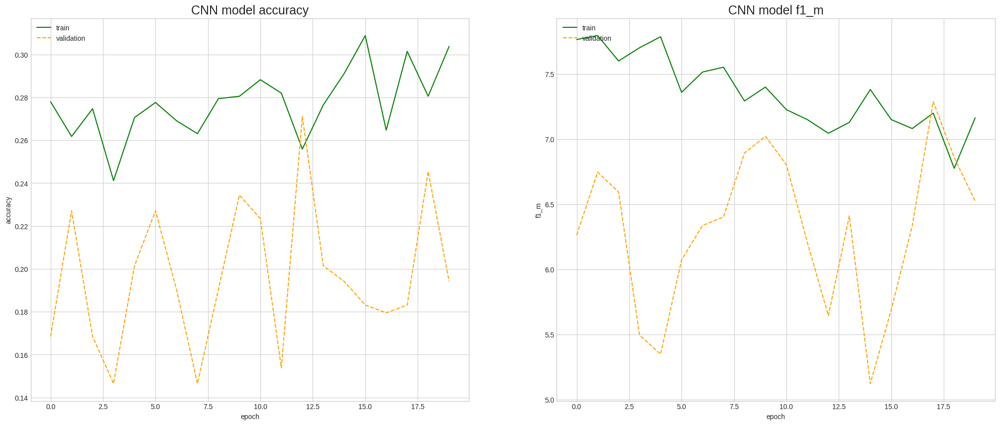

In [ ]:
plot_history_scores(
    dict_history = history_prep,
    first_score = "accuracy",
    second_score = "f1_m",
    outpath = "../images/deep-learning/accuracy-prep.png")

### **4.3.&nbsp;Nouvelle Architecture et optimisation d'hyperparamètres**

**Test nouvelle architecture**

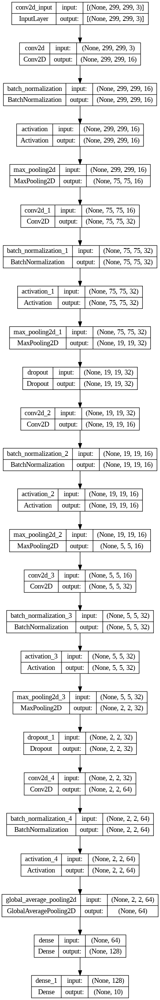

In [ ]:
K.clear_session()
model_prep_na = Sequential()

# Convolution layer
model_prep_na.add(Conv2D(filters=16,
                 kernel_size=(3,3),
                 padding='same',
                 use_bias=False,
                 input_shape=(299,299,3)))
model_prep_na.add(BatchNormalization(axis=3, scale=False))
model_prep_na.add(Activation('relu'))
# Pooling layer
model_prep_na.add(MaxPooling2D(pool_size=(4, 4),
                       strides=(4, 4),
                       padding='same'))

# Second convolution layer
model_prep_na.add(Conv2D(filters=32,
                 kernel_size=(3,3),
                 padding='same',
                 use_bias=False))
model_prep_na.add(BatchNormalization(axis=3, scale=False))
model_prep_na.add(Activation('relu'))
model_prep_na.add(MaxPooling2D(pool_size=(4, 4), strides=(4, 4), padding='same'))
model_prep_na.add(Dropout(0.2))

# Third convolution layer
model_prep_na.add(Conv2D(filters=16,
                 kernel_size=(3,3),
                 padding='same',
                 use_bias=False,
                 input_shape=(299,299,3)))
model_prep_na.add(BatchNormalization(axis=3, scale=False))
model_prep_na.add(Activation('relu'))
model_prep_na.add(MaxPooling2D(pool_size=(4, 4),
                       strides=(4, 4),
                       padding='same'))
# Fourth convolution layer
model_prep_na.add(Conv2D(filters=32,
                 kernel_size=(3,3),
                 padding='same',
                 use_bias=False))
model_prep_na.add(BatchNormalization(axis=3, scale=False))
model_prep_na.add(Activation('relu'))
model_prep_na.add(MaxPooling2D(pool_size=(4, 4), strides=(4, 4), padding='same'))
model_prep_na.add(Dropout(0.2))

# Fifth convolution layer
model_prep_na.add(Conv2D(filters=64,
                 kernel_size=(3,3),
                 padding='same',
                 use_bias=False))
model_prep_na.add(BatchNormalization(axis=3, scale=False))
model_prep_na.add(Activation('relu'))
model_prep_na.add(GlobalAveragePooling2D())
# Fully connected layers
model_prep_na.add(Dense(128, activation='relu'))
model_prep_na.add(Dense(num_breeds, activation='softmax'))
plot_model(model_prep_na, to_file='CNN_model_prep_plot_new_archi.png',
           show_shapes=True, show_layer_names=True)

In [ ]:
model_prep_na.compile(optimizer="adam",
              loss="sparse_categorical_crossentropy",
              metrics=["accuracy", f1_m])

In [ ]:
history_prep_na = model_prep_na.fit(
    train_datagen_prep.flow(
        x_prep_train, y_prep_train,
        batch_size=16,
        subset='training'),
    validation_data=train_datagen_prep.flow(
        x_prep_train, y_prep_train,
        batch_size=16,
        subset='validation'),
    steps_per_epoch=len(x_prep_train) / 32,
    epochs=20,
    verbose=2)

Epoch 1/20
42/42 - 26s - loss: 2.3167 - accuracy: 0.1309 - f1_m: 9.2470 - val_loss: 2.2971 - val_accuracy: 0.1319 - val_f1_m: 9.9551 - 26s/epoch - 611ms/step
Epoch 2/20
42/42 - 16s - loss: 2.2557 - accuracy: 0.1715 - f1_m: 9.3660 - val_loss: 2.2933 - val_accuracy: 0.1429 - val_f1_m: 9.4669 - 16s/epoch - 386ms/step
Epoch 3/20
42/42 - 16s - loss: 2.2037 - accuracy: 0.1824 - f1_m: 8.4754 - val_loss: 2.2729 - val_accuracy: 0.1538 - val_f1_m: 8.6212 - 16s/epoch - 382ms/step
Epoch 4/20
42/42 - 16s - loss: 2.2033 - accuracy: 0.1897 - f1_m: 8.3881 - val_loss: 2.2705 - val_accuracy: 0.1905 - val_f1_m: 9.3666 - 16s/epoch - 384ms/step
Epoch 5/20
42/42 - 16s - loss: 2.1662 - accuracy: 0.2074 - f1_m: 8.1175 - val_loss: 2.2434 - val_accuracy: 0.1648 - val_f1_m: 8.6056 - 16s/epoch - 379ms/step
Epoch 6/20
42/42 - 16s - loss: 2.1710 - accuracy: 0.2035 - f1_m: 7.6047 - val_loss: 2.2050 - val_accuracy: 0.1978 - val_f1_m: 9.1563 - 16s/epoch - 383ms/step
Epoch 7/20
42/42 - 17s - loss: 2.1672 - accuracy: 0.

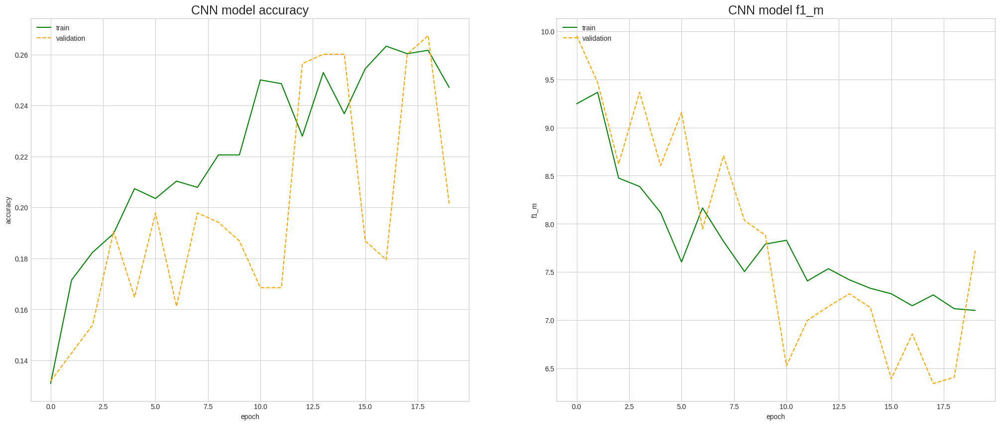

In [ ]:
plot_history_scores(
    dict_history = history_prep_na,
    first_score = "accuracy",
    second_score = "f1_m",
    outpath = "../images/deep-learning/accuracy-prep_na.png")

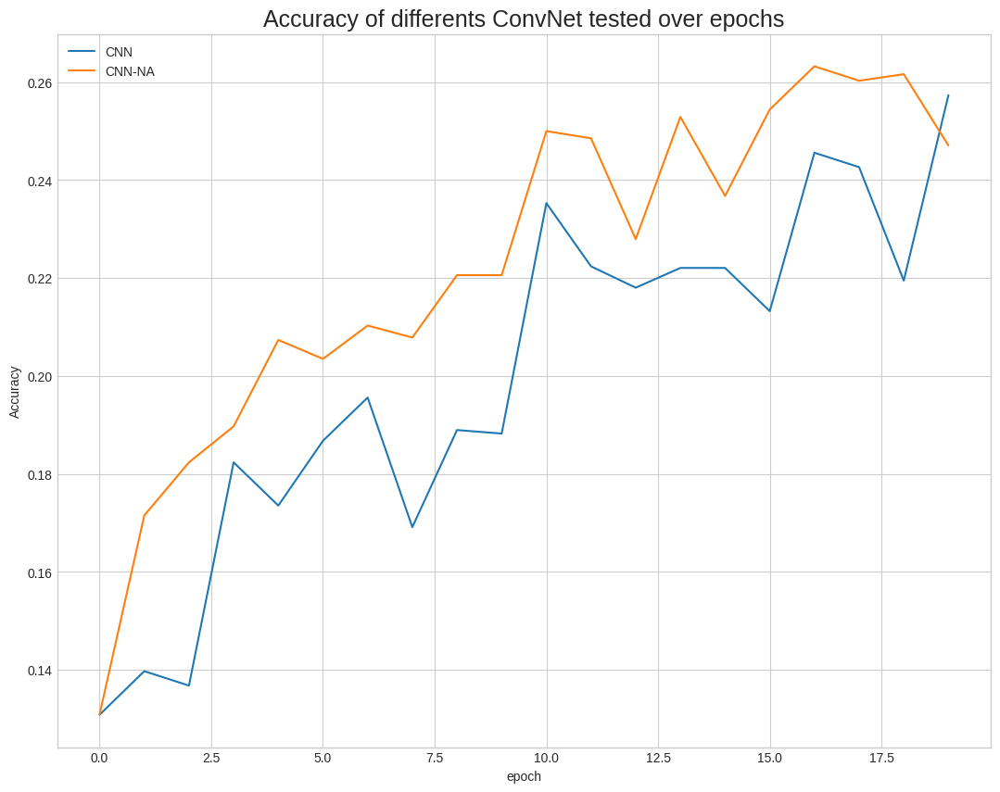

In [ ]:
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(13,10))
    plt.plot(history_prep.history['accuracy'],
             label='CNN')
    plt.plot(history_prep_na.history['accuracy'],
             label='CNN-NA')
    plt.title('Accuracy of differents ConvNet tested over epochs',
              fontsize=18)
    plt.ylabel('Accuracy')
    plt.xlabel('epoch')
    plt.legend(loc='upper left')
    plt.savefig("../images/deep-learning/accuracy-cnn-vs-cnn-na.png")
    plt.show()

**Optimisation des paramètres du modèle CNN avec un gridsearch**

In [ ]:
# hyperparameter optimization
from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasClassifier

In [ ]:
n_epochs_cv = 10
n_cv = 3

In [ ]:
def cnn_with_gridsearch(pool_type='max',activation='sigmoid',dropout_rate=0):

  model = Sequential()
  # Convolution layer
  model.add(Conv2D(filters=16,
                  kernel_size=(3,3),
                  activation=activation,
                  padding='same',
                  use_bias=False,
                  input_shape=(299,299,3)))
  model.add(BatchNormalization(axis=3, scale=False))
  #model_prep.add(Activation('relu'))
  # Pooling layer
  if pool_type == 'max':
    model.add(MaxPooling2D(pool_size=(4, 4),
                          strides=(4, 4),
                          padding='same'))
  if pool_type == 'average':
    model.add(AveragePooling2D(pool_size=(4, 4),
                          strides=(4, 4),
                          padding='same'))
  if dropout_rate != 0:
    model.add(Dropout(rate=dropout_rate))
  # Second convolution layer
  model.add(Conv2D(filters=32,
                  kernel_size=(3,3),
                  activation=activation,
                  padding='same',
                  use_bias=False))
  model.add(BatchNormalization(axis=3, scale=False))
  #model_prep.add(Activation('relu'))
  #model_prep.add(MaxPooling2D(pool_size=(4, 4), strides=(4, 4), padding='same'))
  if pool_type == 'max':
    model.add(MaxPooling2D(pool_size=(4, 4),
                          strides=(4, 4),
                          padding='same'))
  if pool_type == 'average':
    model.add(AveragePooling2D(pool_size=(4, 4),
                          strides=(4, 4),
                          padding='same'))
  if dropout_rate != 0:
    model.add(Dropout(rate=dropout_rate))
  # Third convolution layer
  model.add(Conv2D(filters=64,
                  kernel_size=(3,3),
                  activation=activation,
                  padding='same',
                  use_bias=False))
  model.add(BatchNormalization(axis=3, scale=False))
  #model_prep.add(Activation('relu'))
  model.add(GlobalAveragePooling2D())
  # Fully connected layers
  model.add(Dense(128, activation='relu'))
  model.add(Dense(num_breeds, activation='softmax'))
  model.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=['accuracy'],
        )
  return model

In [ ]:
def display_cv_results(search_results):
    print('Best score = {:.4f} using {}'.format(search_results.best_score_, search_results.best_params_))
    means = search_results.cv_results_['mean_test_score']
    stds = search_results.cv_results_['std_test_score']
    params = search_results.cv_results_['params']
    for mean, stdev, param in zip(means, stds, params):
        print('mean test accuracy +/- std = {:.4f} +/- {:.4f} with: {}'.format(mean, stdev, param))

In [ ]:
start=time()
# create model
model_prep_grid = KerasClassifier(build_fn=cnn_with_gridsearch, verbose=1)
# define parameters and values for grid search
param_grid = {
    'batch_size': [16, 32, 64],
    'pool_type': ['max', 'average'],
    'activation': ['sigmoid', 'relu'],
    'epochs': [n_epochs_cv],
    'dropout_rate': [0.0, 0.10, 0.20],
}
grid = GridSearchCV(estimator=model_prep_grid, param_grid=param_grid, n_jobs=None, cv=n_cv)
grid_result = grid.fit(x_prep_train, y_prep_train)  # fit the full dataset as we are using cross validation

# print out results
print('time for grid search = {:.0f} sec'.format(time()-start))
display_cv_results(grid_result)

<ipython-input-58-7d36948a40b3>:3: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model_prep_grid = KerasClassifier(build_fn=cnn_with_gridsearch, verbose=1)


Epoch 1/10
57/57 [==============================] - 1s 12ms/step - loss: 2.3176 - accuracy: 0.1195
Epoch 2/10
57/57 [==============================] - 1s 12ms/step - loss: 2.2952 - accuracy: 0.1305
Epoch 3/10
57/57 [==============================] - 1s 12ms/step - loss: 2.2605 - accuracy: 0.1579
Epoch 4/10
57/57 [==============================] - 1s 12ms/step - loss: 2.2475 - accuracy: 0.1425
Epoch 5/10
57/57 [==============================] - 1s 12ms/step - loss: 2.2356 - accuracy: 0.1568
Epoch 6/10
57/57 [==============================] - 1s 12ms/step - loss: 2.2169 - accuracy: 0.1798
Epoch 7/10
57/57 [==============================] - 1s 12ms/step - loss: 2.2016 - accuracy: 0.1853
Epoch 8/10
57/57 [==============================] - 1s 11ms/step - loss: 2.2109 - accuracy: 0.1678
Epoch 9/10
57/57 [==============================] - 1s 12ms/step - loss: 2.2263 - accuracy: 0.1601
Epoch 10/10
29/29 [==============================] - 0s 8ms/step - loss: 2.3644 - accuracy: 0.1313
Epoch 1/10

### **5.&nbsp;Transfer Learning : Modèle Xception**

Le modèle Xception est dérivé de l'architecture Inception. Inception a pour but de réduire la consommation de ressources des CNN profonds.

En effet Xception semble adapté pour notre transfert learning : Taille de 88 MB, Top-5 Accuracy à 0.945 et Depth à 126. Les images en entrée de ce modèle seront de 299px x 299px

La dimension de l’image analysée est réduite par les filtres 3x3 et 5x5, en ajoutant une étape de filtrage 1x1 en amont. De cette façon, la convolution de taille 1x1 effectue une opération de pooling sur les valeurs d’un pixel dans l’espace des dimensions de l’image.

Xception remplace les modules Inception par des modules de convolutions séparables en profondeur (en anglais depthwise separable convolution) et ajoute des liaisons résiduelles. Ce type d’approche permet de considérablement réduire l’utilisation de ressources lors du calcul matriciel, sans modifier le nombre de paramètres.

### **5.1.&nbsp;Importation du modèle Xception**

In [ ]:
K.clear_session()
# Import Xception trained model
xception_model = tf.keras.applications.xception.Xception(
    weights='imagenet',
    include_top=False,
    pooling='avg',
    input_shape=(299,299,3))

# look at the differents layers
print("-" * 50)
print("Xception base model layers :")
print("-" * 50)
for layer in xception_model.layers:
    print(layer)

83683744/83683744 [==============================] - 5s 0us/step
--------------------------------------------------
Xception base model layers :
--------------------------------------------------


### **5.2.&nbsp;entrainement du modèle Xception**


Notre jeu de données est petit et relativement similaire au dataset original. Si nous entrainons le réseau complet, nous risquons de rencontrer des problèmes d'over-fitting. Nous allons donc "geler" tous les layers de Xception et entrainer uniquement le classifier

In [ ]:
for layer in xception_model.layers:
    layer.trainable = False

On remarque dans les layers importés du modèle que la dernière couche importée est une couche GlobalAveragePooling2D. Nous allons donc ajouter une couche complétement connectée, un DropOut et enfin le classifier dans un nouveau modèle :

In [ ]:
# Add new fully-connected layers
base_output = xception_model.output
base_output = Dense(128, activation='relu')(base_output)
base_output = Dropout(0.2)(base_output)
# Output : new classifier
predictions = Dense(num_breeds, activation='softmax')(base_output)

# Define new model
my_xcept_model = Model(inputs=xception_model.input,
                       outputs=predictions)
my_xcept_model.compile(optimizer="adam",
                       loss="sparse_categorical_crossentropy",
                       metrics=["accuracy", f1_m])

In [ ]:
Xception_plot = plot_model(my_xcept_model,
                           to_file='my_xcept_model_plot.png',
                           show_shapes=True,
                           show_layer_names=False)

Il est également nécessaire de modifier les générateurs pour y intégrer le preprocess_input Xception recommandé par Keras

In [ ]:
# Data generator on train set with Data Augmentation
# and preprocess_input Xception
# Validation set is define here
train_datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2,
    preprocessing_function=tf.keras.applications.xception.preprocess_input)

#For validation and test, just rescale
test_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.xception.preprocess_input)

In [ ]:
history_xcept = my_xcept_model.fit(
    train_datagen.flow(
        x_prep_train, y_prep_train,
        batch_size=16,
        subset='training'),
    validation_data=train_datagen.flow(
        x_prep_train, y_prep_train,
        batch_size=16,
        subset='validation'),
    steps_per_epoch=len(x_prep_train) / 32,
    epochs=20,
    verbose=2)

Epoch 1/20
42/42 - 20s - loss: 1.4518 - accuracy: 0.5191 - f1_m: 4.7847 - val_loss: 0.6912 - val_accuracy: 0.8132 - val_f1_m: 2.3907 - 20s/epoch - 474ms/step
Epoch 2/20
42/42 - 16s - loss: 0.7503 - accuracy: 0.7500 - f1_m: 2.2058 - val_loss: 0.6189 - val_accuracy: 0.7985 - val_f1_m: 1.6625 - 16s/epoch - 384ms/step
Epoch 3/20
42/42 - 16s - loss: 0.6692 - accuracy: 0.7779 - f1_m: 1.9087 - val_loss: 0.5062 - val_accuracy: 0.8132 - val_f1_m: 1.5996 - 16s/epoch - 383ms/step
Epoch 4/20
42/42 - 17s - loss: 0.5432 - accuracy: 0.8118 - f1_m: 1.8583 - val_loss: 0.5477 - val_accuracy: 0.8132 - val_f1_m: 1.5068 - 17s/epoch - 388ms/step
Epoch 5/20
42/42 - 16s - loss: 0.5310 - accuracy: 0.8162 - f1_m: 1.6572 - val_loss: 0.5154 - val_accuracy: 0.8278 - val_f1_m: 1.4383 - 16s/epoch - 383ms/step
Epoch 6/20
42/42 - 17s - loss: 0.4965 - accuracy: 0.8285 - f1_m: 1.6027 - val_loss: 0.5265 - val_accuracy: 0.8315 - val_f1_m: 1.4702 - 17s/epoch - 389ms/step
Epoch 7/20
42/42 - 17s - loss: 0.4558 - accuracy: 0.

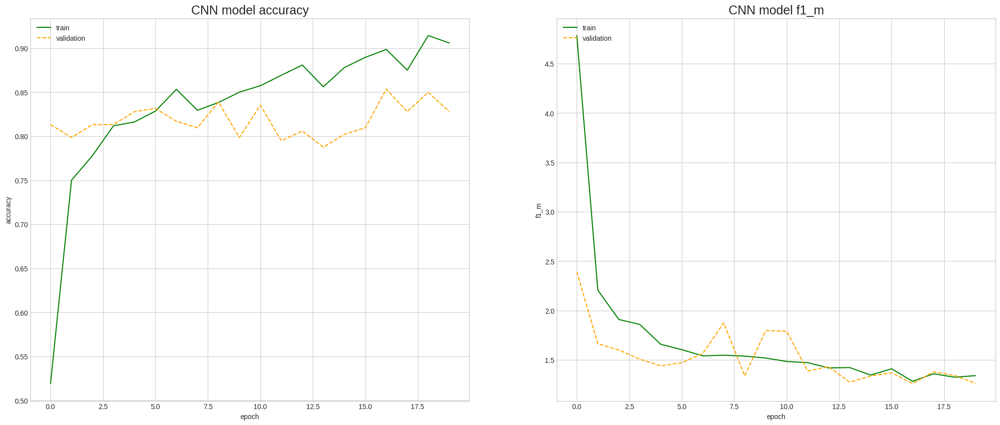

In [ ]:
plot_history_scores(
    dict_history = history_xcept,
    first_score = "accuracy",
    second_score = "f1_m",
    outpath = "../images/deep-learning/accuracy-xcept.png")

On voit très bien ici que les métriques du modèle Xception sur nos données sont bien meilleures que le modèle "from scratch" quand les couches profondes ne sont pas entrainées. D'autre part, le modèle apprend très vite et l'accuracy augmente rapidement (tout comme la perte diminue). Comparons les 2 modèles :

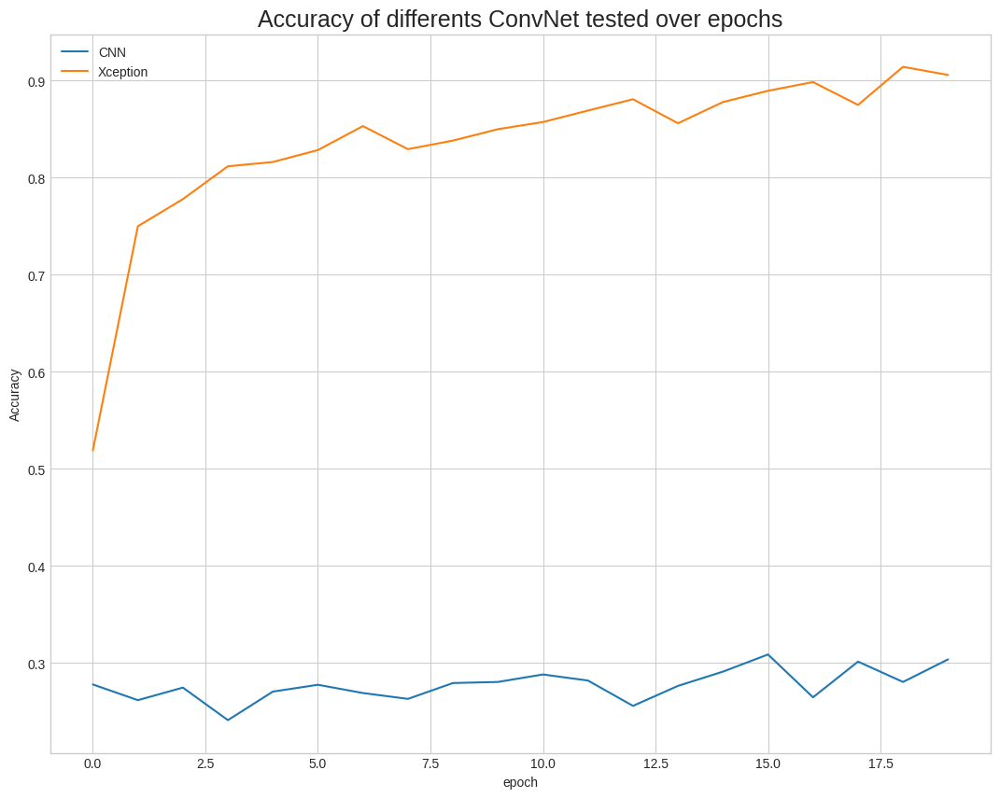

In [ ]:
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(13,10))
    plt.plot(history_prep.history['accuracy'],
             label='CNN')
    plt.plot(history_xcept.history['accuracy'],
             label='Xception')
    plt.title('Accuracy of differents ConvNet tested over epochs',
              fontsize=18)
    plt.ylabel('Accuracy')
    plt.xlabel('epoch')
    plt.legend(loc='upper left')
    plt.savefig("../images/deep-learning/accuracy-cnn-vs-xcept.png")
    plt.show()

In [ ]:
xcept_mean_accuracy = np.mean(history_xcept.history['val_accuracy'])
xcept_mean_f1 = np.mean(history_xcept.history['val_f1_m'])
print("-" * 50)
print("Xception base model validation Scores :")
print("-" * 50)
print("Mean validation accuracy: {:.2f}"\
      .format(xcept_mean_accuracy))
print("Mean validation F1 score: {:.2f}"\
      .format(xcept_mean_f1))

--------------------------------------------------
Xception base model validation Scores :
--------------------------------------------------
Mean validation accuracy: 0.81
Mean validation F1 score: 1.44


### **5.3.&nbsp;Comparaison avec le modèle ResNet50**

Dans un réseau de neurones à convolution profonde, plusieurs couches sont empilées et entraînées à la tâche à accomplir. Le réseau apprend plusieurs caractéristiques de niveau bas/moyen/haut à la fin de ses couches. Dans l'apprentissage résiduel, au lieu d'essayer d'apprendre certaines caractéristiques, le réseau apprend certaines caractéristiques résiduelles. Le résidu peut être simplement compris comme une soustraction d'une caractéristique apprise à partir de l'entrée de cette couche. ResNet le fait en utilisant des connexions de raccourci (connectant directement l'entrée de la nième couche à une (n+x)ième couche). Son architecture est la suivante :

In [ ]:
K.clear_session()
# Import ResNet50 trained model
resnet_model = tf.keras.applications.ResNet50(
    weights='imagenet',
    include_top=False,
    pooling='avg',
    input_shape=(299,299,3))

# Dont retrain layers
for rn_layer in resnet_model.layers:
    rn_layer.trainable = False

# Add new fully-connected layers
rn_base_output = resnet_model.output
rn_base_output = Dense(128, activation='relu')(rn_base_output)
rn_base_output = Dropout(0.2)(rn_base_output)
# Output : new classifier
rn_predictions = Dense(num_breeds, activation='softmax')(rn_base_output)

# Define new model
my_resnet_model = Model(inputs=resnet_model.input,
                        outputs=rn_predictions)
my_resnet_model.compile(optimizer="adam",
                       loss="sparse_categorical_crossentropy",
                       metrics=["accuracy", f1_m])

# Data generator on train set with Data Augmentation
# and preprocess_input Resnet
# Validation set is define here
rn_train_datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2,
    preprocessing_function=tf.keras.applications.resnet.preprocess_input)

#For validation and test, just rescale
rn_test_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.resnet.preprocess_input)

94765736/94765736 [==============================] - 5s 0us/step


In [ ]:
history_resnet = my_resnet_model.fit(
    rn_train_datagen.flow(
        x_prep_train, y_prep_train,
        batch_size=16,
        subset='training'),
    validation_data=rn_train_datagen.flow(
        x_prep_train, y_prep_train,
        batch_size=16,
        subset='validation'),
    steps_per_epoch=len(x_prep_train) / 32,
    epochs=20,
    verbose=2)

Epoch 1/20
42/42 - 29s - loss: 2.0686 - accuracy: 0.2892 - f1_m: 6.0654 - val_loss: 1.4852 - val_accuracy: 0.4872 - val_f1_m: 4.3602 - 29s/epoch - 666ms/step
Epoch 2/20
42/42 - 17s - loss: 1.2737 - accuracy: 0.5436 - f1_m: 3.6771 - val_loss: 1.0030 - val_accuracy: 0.6813 - val_f1_m: 2.9939 - 17s/epoch - 392ms/step
Epoch 3/20
42/42 - 16s - loss: 1.0366 - accuracy: 0.6294 - f1_m: 2.7063 - val_loss: 1.0448 - val_accuracy: 0.6410 - val_f1_m: 2.3578 - 16s/epoch - 381ms/step
Epoch 4/20
42/42 - 16s - loss: 0.9324 - accuracy: 0.6691 - f1_m: 2.4947 - val_loss: 1.0211 - val_accuracy: 0.6593 - val_f1_m: 2.0900 - 16s/epoch - 379ms/step
Epoch 5/20
42/42 - 16s - loss: 0.8649 - accuracy: 0.7103 - f1_m: 2.3261 - val_loss: 0.8371 - val_accuracy: 0.7399 - val_f1_m: 2.0161 - 16s/epoch - 378ms/step
Epoch 6/20
42/42 - 16s - loss: 0.7263 - accuracy: 0.7544 - f1_m: 2.0800 - val_loss: 0.7963 - val_accuracy: 0.7033 - val_f1_m: 1.9186 - 16s/epoch - 385ms/step
Epoch 7/20
42/42 - 17s - loss: 0.7808 - accuracy: 0.

In [ ]:
my_resnet_model.save('my_resnet50_model.h5')

In [ ]:
history_resnet.model.save('resnet50_model.h5')

22/22 [==============================] - 2s 34ms/step


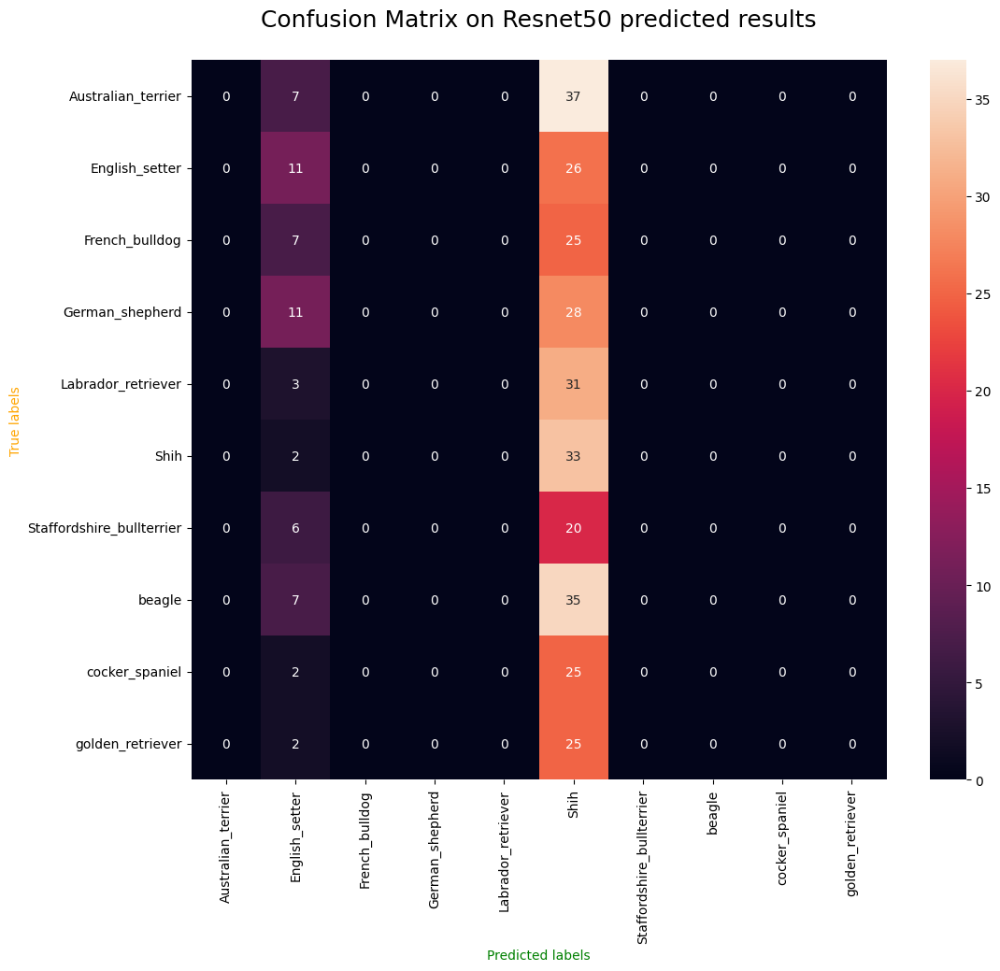

In [ ]:
# Make predictions
Y_pred_res = history_resnet.model.predict(
    test_datagen.flow(
        x_prep_test, y_prep_test,
        batch_size=16,
        shuffle=False))
y_pred_res = np.argmax(Y_pred_res, axis=1)

# Inverse transform of encoding
y_pred_res_s = encoder.inverse_transform(y_pred_res)
y_test_res_s = encoder.inverse_transform(y_prep_test)

# Confusion Matrix
cf_matrix = confusion_matrix(y_prep_test, y_pred_res)

fig = plt.figure(figsize=(12,10))
ax = sns.heatmap(cf_matrix, annot=True)
ax.set_xlabel("Predicted labels", color="g")
ax.set_ylabel("True labels", color="orange")
ax.xaxis.set_ticklabels(encoder.classes_,
                        rotation='vertical')
ax.yaxis.set_ticklabels(encoder.classes_,
                        rotation='horizontal')
plt.title("Confusion Matrix on Resnet50 predicted results\n",
          fontsize=18)
plt.show()

In [ ]:
# Classification report
print(classification_report(
    y_prep_test, y_pred_res,
    target_names=sorted(set(y_test_res_s))))

                           precision    recall  f1-score   support

       Australian_terrier       0.00      0.00      0.00        44
           English_setter       0.19      0.30      0.23        37
           French_bulldog       0.00      0.00      0.00        32
          German_shepherd       0.00      0.00      0.00        39
       Labrador_retriever       0.00      0.00      0.00        34
                     Shih       0.12      0.94      0.21        35
Staffordshire_bullterrier       0.00      0.00      0.00        26
                   beagle       0.00      0.00      0.00        42
           cocker_spaniel       0.00      0.00      0.00        27
         golden_retriever       0.00      0.00      0.00        27

                 accuracy                           0.13       343
                macro avg       0.03      0.12      0.04       343
             weighted avg       0.03      0.13      0.05       343



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


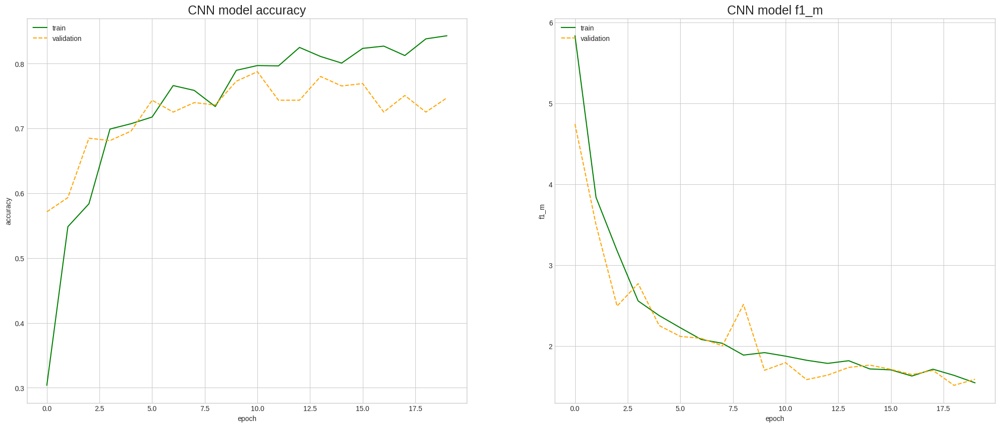

In [ ]:
plot_history_scores(
    dict_history = history_resnet,
    first_score = "accuracy",
    second_score = "f1_m",
    outpath = "../images/deep-learning/accuracy-resnet50.png")

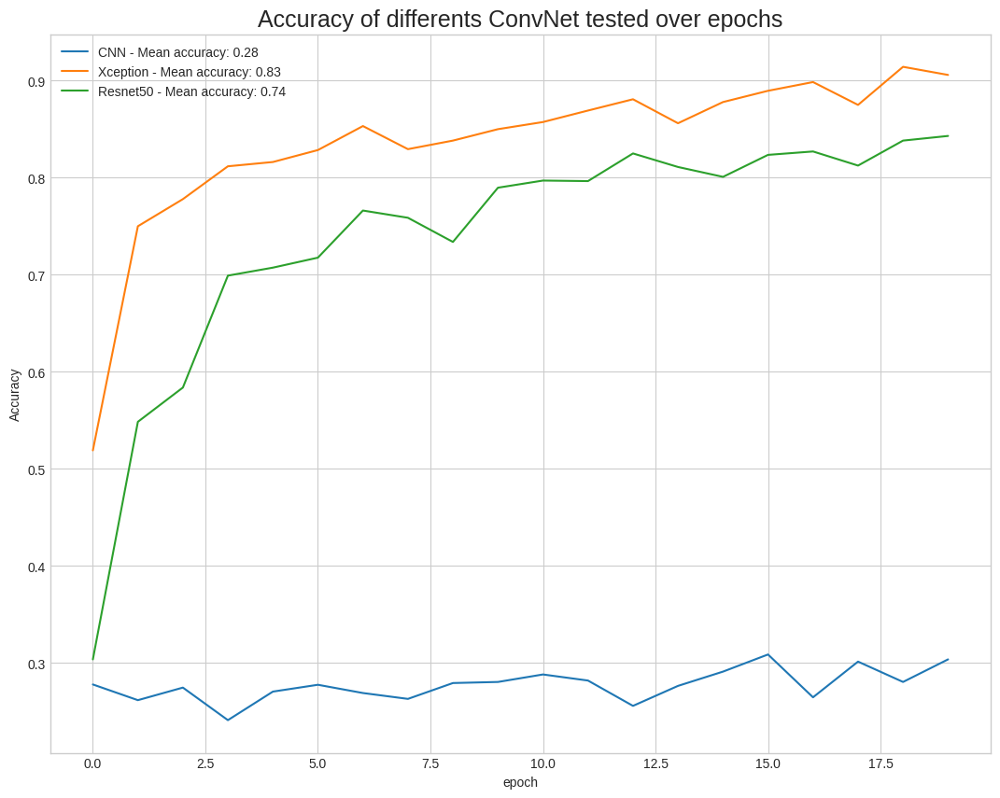

In [ ]:
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(13,10))
    plt.plot(history_prep.history['accuracy'],
             label='CNN - Mean accuracy: {:.2f}'.format(
                 np.mean(history_prep.history['accuracy'])))
    plt.plot(history_xcept.history['accuracy'],
             label='Xception - Mean accuracy: {:.2f}'.format(
                 np.mean(history_xcept.history['accuracy'])))
    plt.plot(history_resnet.history['accuracy'],
             label='Resnet50 - Mean accuracy: {:.2f}'.format(
                 np.mean(history_resnet.history['accuracy'])))
    plt.title('Accuracy of differents ConvNet tested over epochs',
              fontsize=18)
    plt.ylabel('Accuracy')
    plt.xlabel('epoch')
    plt.legend(loc='upper left')
    plt.savefig("../images/deep-learning/accuracy-cnn-vs-xcept-resnet.png")
    plt.show()

A cette étape, sans amélioration des paramètres et sans fine-tuning, le modèle Xception offre les meilleurs résultats. Nous conserverons donc ce modèle pour la suite.

### **5.4.&nbsp;Optimization des paramètres sur la couche classifier du modèle Xception**

Nous allons utiliser kerastuner pour améliorer les paramètres de la couche que nous avons ajouté au moèle Xception de Keras et séléctionner les meilleurs.

In [ ]:
def model_builder(hp):
    # Load base model
    xception_model = tf.keras.applications.xception.Xception(
        weights='imagenet',
        include_top=False,
        pooling='avg',
        input_shape=(299,299,3))

    for layer in xception_model.layers:
        layer.trainable = False

    base_output = xception_model.output

    # Tune dense units
    hp_units = hp.Int('dense_units',
                      min_value=32,
                      max_value=300,
                      step=32,
                      default=128)
    base_output = Dense(units=hp_units,
                        activation='relu')(base_output)

    base_output = Dropout(0.2)(base_output)

    # Output : new classifier
    predictions = Dense(num_breeds, activation='softmax')(base_output)

    # Define new model
    my_xcept_model = Model(inputs=xception_model.input,
                       outputs=predictions)

    # Tune learning rate
    hp_learning_rate = hp.Choice(
        name='learning_rate',
        values=[1e-2, 1e-3, 1e-4])
    my_xcept_model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy", f1_m])

    return my_xcept_model

In [ ]:
# Tune the learning rate for the optimizer
# Constuct the tuner of kerastuner
tuner = kt.RandomSearch(
    model_builder,
    objective='val_accuracy',
    max_trials=5)

# Define a early stopping
stop_early = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy',
    patience=5)
# Search best params
tuner.search(
    train_datagen.flow(
        x_prep_train, y_prep_train,
        batch_size=16,
        subset='training'),
    validation_data=train_datagen.flow(
        x_prep_train, y_prep_train,
        batch_size=16,
        subset='validation'),
    epochs=10,
    callbacks=[stop_early])

# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print("-" * 50)
print("Xception Hyperparameters optimization :")
print("-" * 50)
print(f"""
Best learning rate : {best_hps.get('learning_rate')}.\n
Best Dense units : {best_hps.get('dense_units')}.""")

--------------------------------------------------
Xception Hyperparameters optimization :
--------------------------------------------------

Best learning rate : 0.0001.

Best Dense units : 288.


Une fois les meilleurs paramètres trouvés, on peut ré-entrainer le modèle grâce au tuner, sur 30 époques avant de le sauvegarder pour les prochaines améliorations (fine-tuning) :

In [ ]:
hypermodel = tuner.hypermodel.build(best_hps)
hypermodel.fit(
    train_datagen.flow(
        x_prep_train, y_prep_train,
        batch_size=16,
        subset='training'),
    epochs=30,
    validation_data=train_datagen.flow(
        x_prep_train, y_prep_train,
        batch_size=16,
        subset='validation'),
    verbose=2)
hypermodel.save('xception_hypermodel.h5')
print("Model saved")

Epoch 1/30
69/69 - 27s - loss: 1.8884 - accuracy: 0.4872 - f1_m: 8.2999 - val_loss: 1.3780 - val_accuracy: 0.7143 - val_f1_m: 5.9455 - 27s/epoch - 395ms/step
Epoch 2/30
69/69 - 24s - loss: 1.1214 - accuracy: 0.7354 - f1_m: 4.1663 - val_loss: 0.8861 - val_accuracy: 0.7912 - val_f1_m: 2.6530 - 24s/epoch - 344ms/step
Epoch 3/30
69/69 - 24s - loss: 0.7968 - accuracy: 0.7911 - f1_m: 2.6489 - val_loss: 0.7280 - val_accuracy: 0.7875 - val_f1_m: 2.0297 - 24s/epoch - 343ms/step
Epoch 4/30
69/69 - 23s - loss: 0.6633 - accuracy: 0.8120 - f1_m: 2.2574 - val_loss: 0.5874 - val_accuracy: 0.8205 - val_f1_m: 1.9504 - 23s/epoch - 340ms/step
Epoch 5/30
69/69 - 24s - loss: 0.6331 - accuracy: 0.8130 - f1_m: 2.1222 - val_loss: 0.5763 - val_accuracy: 0.8095 - val_f1_m: 1.7631 - 24s/epoch - 342ms/step
Epoch 6/30
69/69 - 24s - loss: 0.5679 - accuracy: 0.8221 - f1_m: 1.8982 - val_loss: 0.5573 - val_accuracy: 0.8168 - val_f1_m: 1.7735 - 24s/epoch - 342ms/step
Epoch 7/30
69/69 - 23s - loss: 0.5334 - accuracy: 0.

### **5.5.&nbsp;Xception fine tuning**

Comme nous l'avons vu dans le schéma de l'architecture Xception, ce modèle dispose de 3 blocs : le flux d'entrée, le flux moyen et le flux de sortie. Nous allons ré-entrainer le dernier bloc sur le modèle sauvegardé dont les paramètres ont été améliorés :

In [ ]:
def xception_fine_tune(nb_layers):
    # Load the pre trained model
    hypermodel_t = load_model('./xception_hypermodel.h5', custom_objects={"f1_m": f1_m})

    # re train the last layers
    for i, layer in enumerate(hypermodel_t.layers):
        if i < nb_layers:
            layer.trainable = False
        else:
            layer.trainable = True

    # Compile model
    hypermodel_t.compile(
        optimizer='adam',
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy", f1_m])

    return hypermodel_t

In [ ]:
# Define a early stopping
stop_early = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy',
    patience=5)

# Dont train the 115 first layers
my_tuned_xcept_model = xception_fine_tune(115)
fine_tuned_history = my_tuned_xcept_model.fit(
    train_datagen.flow(
        x_prep_train, y_prep_train,
        batch_size=16,
        shuffle=False,
        subset='training'),
    epochs=20,
    validation_data=train_datagen.flow(
        x_prep_train, y_prep_train,
        batch_size=16,
        shuffle=False,
        subset='validation'),
    callbacks=[stop_early],
    verbose=2)


Epoch 1/20
69/69 - 28s - loss: 0.9168 - accuracy: 0.7071 - f1_m: 2.1555 - val_loss: 1.5445 - val_accuracy: 0.7326 - val_f1_m: 1.1770 - 28s/epoch - 400ms/step
Epoch 2/20
69/69 - 24s - loss: 0.6195 - accuracy: 0.8120 - f1_m: 1.5689 - val_loss: 1.0687 - val_accuracy: 0.7656 - val_f1_m: 1.2120 - 24s/epoch - 342ms/step
Epoch 3/20
69/69 - 24s - loss: 0.4353 - accuracy: 0.8613 - f1_m: 1.4548 - val_loss: 0.6879 - val_accuracy: 0.7875 - val_f1_m: 1.2191 - 24s/epoch - 344ms/step
Epoch 4/20
69/69 - 24s - loss: 0.3758 - accuracy: 0.8796 - f1_m: 1.2916 - val_loss: 1.0868 - val_accuracy: 0.7582 - val_f1_m: 1.2218 - 24s/epoch - 343ms/step
Epoch 5/20
69/69 - 24s - loss: 0.3258 - accuracy: 0.9060 - f1_m: 1.2568 - val_loss: 0.9619 - val_accuracy: 0.7839 - val_f1_m: 1.2175 - 24s/epoch - 344ms/step
Epoch 6/20
69/69 - 24s - loss: 0.2638 - accuracy: 0.9224 - f1_m: 1.1455 - val_loss: 0.9875 - val_accuracy: 0.7766 - val_f1_m: 1.2585 - 24s/epoch - 347ms/step
Epoch 7/20
69/69 - 24s - loss: 0.2622 - accuracy: 0.

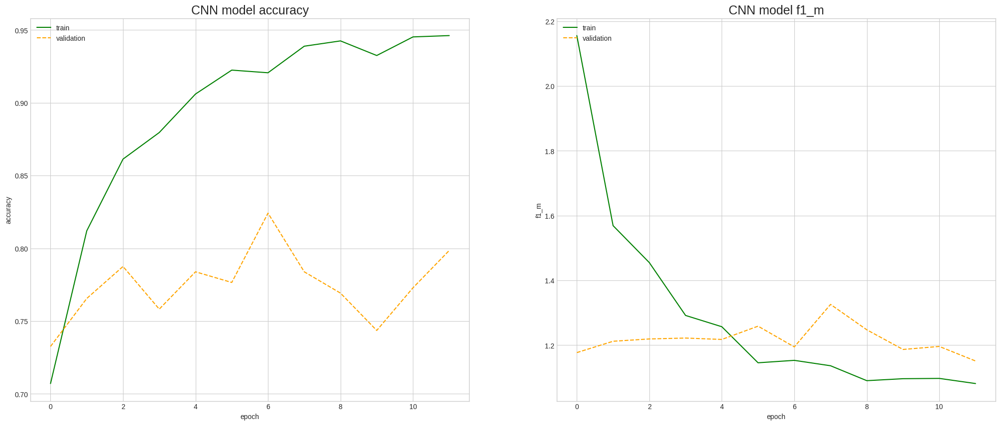

In [ ]:
plot_history_scores(
    dict_history = fine_tuned_history,
    first_score = "accuracy",
    second_score = "f1_m",
    outpath = "../images/deep-learning/accuracy-fine-tuned-xcept.png")

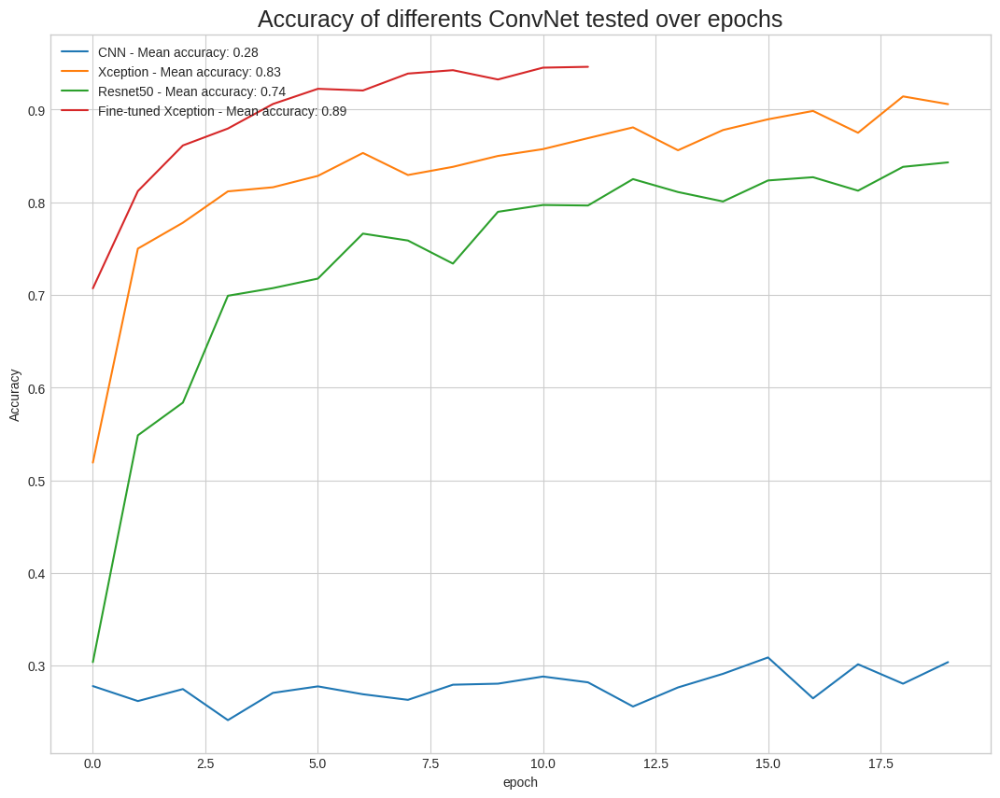

In [ ]:
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(13,10))
    plt.plot(history_prep.history['accuracy'],
             label='CNN - Mean accuracy: {:.2f}'.format(
                 np.mean(history_prep.history['accuracy'])))
    plt.plot(history_xcept.history['accuracy'],
             label='Xception - Mean accuracy: {:.2f}'.format(
                 np.mean(history_xcept.history['accuracy'])))
    plt.plot(history_resnet.history['accuracy'],
             label='Resnet50 - Mean accuracy: {:.2f}'.format(
                 np.mean(history_resnet.history['accuracy'])))
    plt.plot(fine_tuned_history.history['accuracy'],
             label='Fine-tuned Xception - Mean accuracy: {:.2f}'.format(
                 np.mean(fine_tuned_history.history['accuracy'])))
    plt.title('Accuracy of differents ConvNet tested over epochs',
              fontsize=18)
    plt.ylabel('Accuracy')
    plt.xlabel('epoch')
    plt.legend(loc='upper left')
    plt.savefig("../images/deep-learning/accuracy-cnn-vs-xcept-vs-resnet-fine-tuned-xcept.png")
    plt.show()

On voit ici que le meilleur modèle testé est le modèle Xception pré-entrainé avec fine-tuning. Nous allons donc réaliser les évaluations sur nos données test.

### **5.6.&nbsp;Evaluation sur les données test**

Nous allons évaluer ce dernier moèle sur les données test générées grâce au ImageDataGenerator de Keras définit préalablement :

In [ ]:
# Model evaluation on test set
xception_eval = fine_tuned_history.model.evaluate(
    test_datagen.flow(
        x_prep_test, y_prep_test,
        batch_size=16,
        shuffle=False),
    verbose=1)
print("-" * 50)
print("Xception model evaluation :")
print("-" * 50)
print('Test Loss: {:.3f}'.format(xception_eval[0]))
print('Test Accuracy: {:.3f}'.format(xception_eval[1]))
print('Test F1 score: {:.3f}'.format(xception_eval[2]))

22/22 [==============================] - 1s 31ms/step - loss: 0.6565 - accuracy: 0.8338 - f1_m: 1.0683
--------------------------------------------------
Xception model evaluation :
--------------------------------------------------
Test Loss: 0.656
Test Accuracy: 0.834
Test F1 score: 1.068


Puis nous allons éditer la matrice de confusion et le rapport de classification grâce aux données prédites :

22/22 [==============================] - 1s 20ms/step


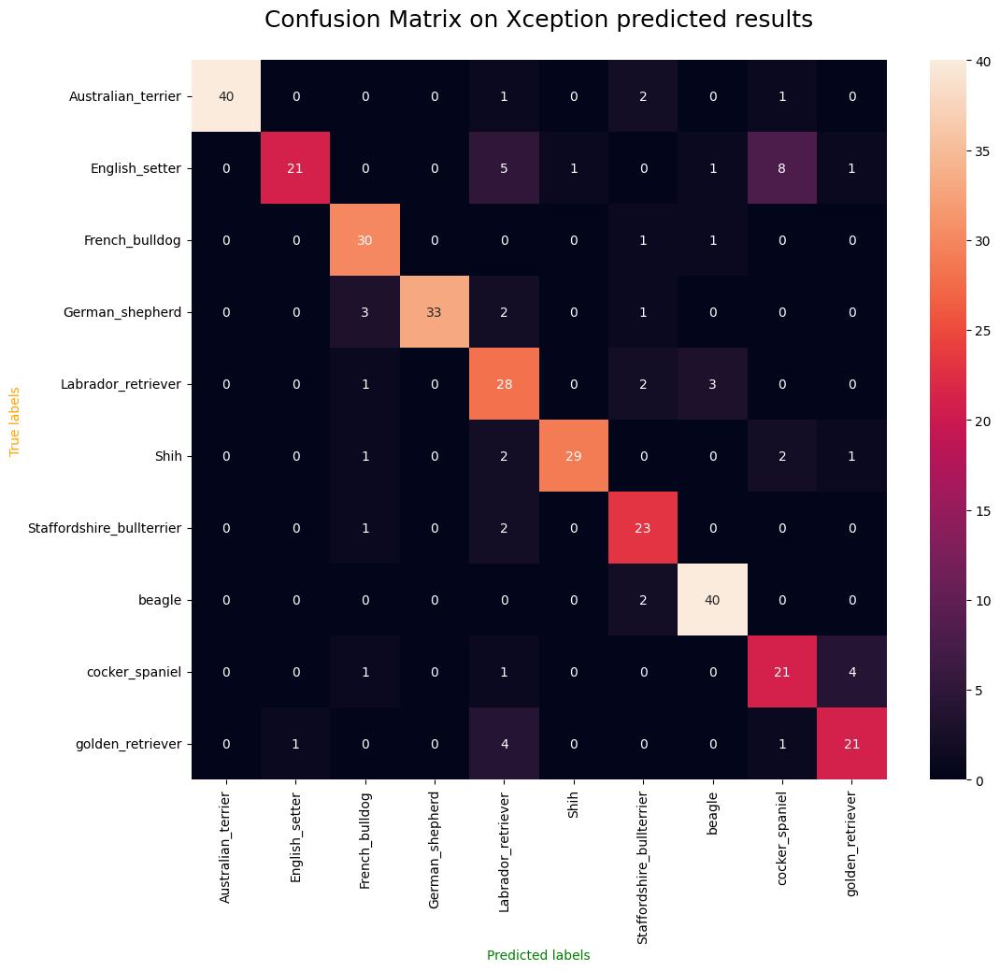

In [ ]:
# Make predictions
Y_pred = fine_tuned_history.model.predict(
    test_datagen.flow(
        x_prep_test, y_prep_test,
        batch_size=16,
        shuffle=False))
y_pred = np.argmax(Y_pred, axis=1)

# Inverse transform of encoding
y_pred_s = encoder.inverse_transform(y_pred)
y_test_s = encoder.inverse_transform(y_prep_test)

# Confusion Matrix
cf_matrix = confusion_matrix(y_prep_test, y_pred)

fig = plt.figure(figsize=(12,10))
ax = sns.heatmap(cf_matrix, annot=True)
ax.set_xlabel("Predicted labels", color="g")
ax.set_ylabel("True labels", color="orange")
ax.xaxis.set_ticklabels(encoder.classes_,
                        rotation='vertical')
ax.yaxis.set_ticklabels(encoder.classes_,
                        rotation='horizontal')
plt.title("Confusion Matrix on Xception predicted results\n",
          fontsize=18)
plt.show()

In [ ]:
# Classification report
print(classification_report(
    y_prep_test, y_pred,
    target_names=sorted(set(y_test_s))))

                           precision    recall  f1-score   support

       Australian_terrier       1.00      0.91      0.95        44
           English_setter       0.95      0.57      0.71        37
           French_bulldog       0.81      0.94      0.87        32
          German_shepherd       1.00      0.85      0.92        39
       Labrador_retriever       0.62      0.82      0.71        34
                     Shih       0.97      0.83      0.89        35
Staffordshire_bullterrier       0.74      0.88      0.81        26
                   beagle       0.89      0.95      0.92        42
           cocker_spaniel       0.64      0.78      0.70        27
         golden_retriever       0.78      0.78      0.78        27

                 accuracy                           0.83       343
                macro avg       0.84      0.83      0.83       343
             weighted avg       0.86      0.83      0.84       343



La matrice de confusion et le rapport de classification nous indiquent que les résultats sont satisfaisants.ccuracy globale sur le jeu de test est de 0.83 et la matrice présente bien les couples predict / true majoritaires en diagonale.Nous allons visualiser quelques-unes de ces prédictions avec leurs labels :

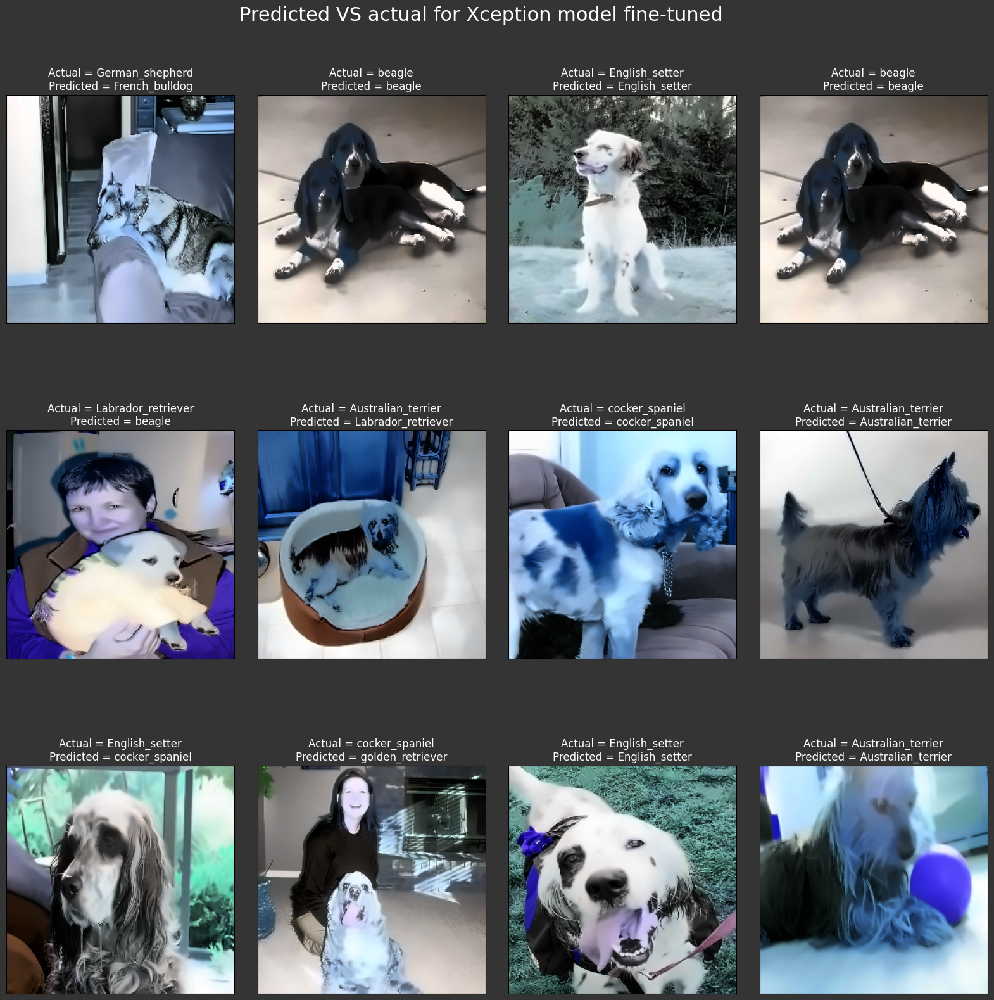

In [ ]:
fig = plt.figure(1, figsize=(20,20))
fig.patch.set_facecolor('#343434')
plt.suptitle("Predicted VS actual for Xception model fine-tuned",
             y=.92, fontsize=22,
             color="white")

n = 0

for i in range(12):
    n+=1
    r = int(np.random.randint(0, x_prep_test.shape[0], 1))
    plt.subplot(3,4,n)
    plt.subplots_adjust(hspace = 0.1, wspace = 0.1)
    plt.imshow(image.array_to_img(x_prep_test[r]))
    plt.title('Actual = {}\nPredicted = {}'.format(y_test_s[r] , y_pred_s[r]),
              color="white")
    plt.xticks([]) , plt.yticks([])
plt.savefig("../images/deep-learning/predict-fine-tuned-xcept.png")
plt.show()

### **6.&nbsp;Interface de prédiction sur de nouvelles données**

A présent, nous allons développer un script pour permettre la prédiction de la race du chien à partir d'une photo. Notre modèle pré-entrainé servira de base. Pour cela, nous allons utiliser Gradio pour importer les images (inputs) et appliquer notre classifier afin de retourner la prédiction

In [ ]:
# Save the last model
fine_tuned_history.model.save('xception_trained_model.h5')
print("Last model saved")

Last model saved


In [ ]:
# Load model
model = load_model('./xception_hypermodel.h5', custom_objects={"f1_m": f1_m})

# Define the full prediction function
def breed_prediction(inp):
    # Convert to RGB
    img = cv.cvtColor(inp,cv.COLOR_BGR2RGB)
    # Resize image
    dim = (299, 299)
    img = cv.resize(img, dim, interpolation=cv.INTER_LINEAR)
    # Equalization
    img_yuv = cv.cvtColor(img,cv.COLOR_BGR2YUV)
    img_yuv[:,:,0] = cv.equalizeHist(img_yuv[:,:,0])
    img_equ = cv.cvtColor(img_yuv, cv.COLOR_YUV2RGB)
    # Apply non-local means filter on test img
    dst_img = cv.fastNlMeansDenoisingColored(
        src=img_equ,
        dst=None,
        h=10,
        hColor=10,
        templateWindowSize=7,
        searchWindowSize=21)
    # Convert modified img to array
    img_array = keras.preprocessing.image.img_to_array(dst_img)

    # Apply preprocess Xception
    img_array = img_array.reshape((-1, 299, 299, 3))
    img_array = tf.keras.applications.xception.preprocess_input(img_array)

    # Predictions
    prediction = model.predict(img_array).flatten()

    #return prediction
    return {encoder.classes_[i]: float(prediction[i]) for i in range(num_breeds)}

# Construct the interface
image = gr.inputs.Image(shape=(299,299))
label = gr.outputs.Label(num_top_classes=3)

gr.Interface(
    fn=breed_prediction,
    inputs=image,
    outputs=label,
    capture_session=True
).launch(share=True)

/usr/local/lib/python3.10/dist-packages/gradio/inputs.py:259: UserWarning: Usage of gradio.inputs is deprecated, and will not be supported in the future, please import your component from gradio.components
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/gradio/deprecation.py:40: UserWarning: `optional` parameter is deprecated, and it has no effect
  warnings.warn(value)
/usr/local/lib/python3.10/dist-packages/gradio/outputs.py:197: UserWarning: Usage of gradio.outputs is deprecated, and will not be supported in the future, please import your components from gradio.components
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/gradio/deprecation.py:40: UserWarning: The 'type' parameter has been deprecated. Use the Number component instead.
  warnings.warn(value)
/usr/local/lib/python3.10/dist-packages/gradio/deprecation.py:40: UserWarning: `capture_session` parameter is deprecated, and it has no effect
  warnings.warn(value)


Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Running on public URL: https://5f0a36ae64c1c64ddc.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades (NEW!), check out Spaces: https://huggingface.co/spaces


In [ ]:
from IPython.display import IFrame
IFrame('https://cnn-computer-vision.herokuapp.com/', width=1000, height=900)